<a id='top'></a>

<center><img style="width: 400px;" src="Fake News Cover Image.jpg" alt="Fake News image"></center>
<center><font size="1">https://d18lkz4dllo6v2.cloudfront.net/cumulus_uploads/entry/2018-06-13/Fake%20News%20Cover%20Image.jpg?pw=1200</font></center>

<h1><center>CM3070 Computer Science Final Project</center></h1>
<h3><center>Code for Final Report</center></h3>

This is the code that accompanies the Final Report. There is a well laid out Table of Contents showing the different sections.

To run this code, you will need four datasets and the following folder structure in the root folder where this .ipynb file resides:

- ./Data/Kaggle/kaggle.csv
- ./Data/Kaggle/kaggle_with_meta_data.csv
- ./Data/Liar/liar.csv
- ./Data/Liar/liar_with_meta_data.csv

The datasets can be found here: https://drive.google.com/drive/folders/1AwU-BHtA_8v-BeC1vekDLI0teNz3_QxM?usp=sharing

There is also a requirements.txt file that you can use to import all necessary libraries. The code has the webscraping section commented out since the webscraping can take several days to complete! However, two of the datasets above include the scraped data and are imported directly from .csv files.

The code takes about 45 minutes to run on a laptop with a core i7 processor and 16GB of RAM.

## Table of Contents
* 1. Import Libraries
* 2. Data Exploration
	* 2.1 Kaggle Dataset
	* 2.2 Liar Dataset
* 3. Data Preparation and Cleaning
	* 3.1 Kaggle Dataset
	* 3.2 Liar Dataset
* 4. Data Visualization
	* 4.1 Kaggle Dataset
	* 4.2 Liar Dataset
* 5. Machine Learning without meta-data
	* 5.1 Kaggle with Count Vectorizer
	* 5.2 Kaggle with TF-IDF
	* 5.3 Liar with Count Vectorizer
	* 5.4 Liar with TF-IDF
	* 5.5 Assessment of Machine Learning models without meta-data
* 6. Neural Network without meta-data
	* 6.1 Neural Network with Kaggle Dataset
	* 6.2 Neural Network with Liar Dataset
* 7. Web scraping for meta-data
* 8. Machine Learning with meta-data
	* 8.1 Preprocessing the datasets
	* 8.2 Assessment of Machine Learning models with meta-data
* 9. Neural Network with meta-data
	* 9.1 Kaggle with meta-data
	* 9.2 Liar with meta-data
	* 9.3 Assessment of Neural Network with meta-data

<a id='import_libraries'></a>
# 1. Import Libraries

In [1]:
# Import all necessary libraries for the project

# Plotting libraries to display plots
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
# display/save plots inline
%matplotlib inline

# Import Pandas and numpy for numerical and data manipulation
import pandas as pd
import numpy as np

# To calculate the mean of a list
from statistics import mean

# Import the Natural Language Toolkit and associated libraries
# Used for Common Natural Language Processing Tasks,
# such as Lemmatization, tokenization, removing stopwords, etc.
import nltk
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
# Download 'punkt' package for tokenization
nltk.download('punkt')
# And download the nltk stopwords
nltk.download('stopwords')

# Import library for Regular Expressions
# Used for cleaning up the text
import re

# Import wordcloud to visually display common words
from wordcloud import WordCloud, STOPWORDS

# Import Gensim library for topic modelling and natural language processing
# Used for simple pre-processing of text
# And also for word2vec
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from gensim.models import Word2Vec

# Used to efficiently manipulate iterations on large datasets
import itertools

# Import the scikit-learn Machine Learning libraries
# Used for vectorization
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
# Train/Test split
from sklearn.model_selection import train_test_split
# For Multinomial Naive Bayes model
from sklearn.naive_bayes import MultinomialNB
# For Support Vector Machine
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
# For Logistic Regression
from sklearn.linear_model import LogisticRegression
# For Decision Tree
from sklearn import tree
# Reports and metrics
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn import metrics

# Import Tensorflow Machine Learning Library
import tensorflow as tf

# Import Keras API for Tensorflow
from tensorflow.keras.preprocessing.text import one_hot, Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Embedding, Input, LSTM, Conv1D, MaxPool1D, Bidirectional
from tensorflow.keras.models import Model

# Used for Google Search
from googlesearch import search

# BeautifulSoup is used to parse webpage content
from bs4 import BeautifulSoup

# For Browser automation to download webpages
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.chrome.service import Service

# Need chromedriver to open and download webpages
s = Service('C:/Users/glavoy/Downloads/chromedriver.exe')
options = Options()
options.headless = True
options.add_argument("--window-size=1000,600")

# This ensures the Chrome browser does not load images and javascript,
# therefore, speeding up the process
chrome_options = webdriver.ChromeOptions()
chrome_options.add_experimental_option(
    # this will disable image loading
    "prefs", {"profile.managed_default_content_settings.images": 2})

# To see ho long it takes to run
import time

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\glavoy\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\glavoy\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
start = time.time()

<a id='data_exploration'></a>
# 2. Data Exploration

<a id='2.1-kaggle_dataset'></a>
### 2.1 Data Exploration - Kaggle dataset

In [3]:
# Read the Kaggle dataset from file into a dataframe
df_kaggle = pd.read_csv("./Data/Kaggle/kaggle.csv")

In [4]:
# Take a look at the head to see what the columns look like
df_kaggle.head()

,id,title,author,text,label
0,0,House Dem Aide: We Didn’t Even See Comey’s Let...,Darrell Lucus,House Dem Aide: We Didn’t Even See Comey’s Let...,1
1,1,"FLYNN: Hillary Clinton, Big Woman on Campus - ...",Daniel J. Flynn,Ever get the feeling your life circles the rou...,0
2,2,Why the Truth Might Get You Fired,Consortiumnews.com,"Why the Truth Might Get You Fired October 29, ...",1
3,3,15 Civilians Killed In Single US Airstrike Hav...,Jessica Purkiss,Videos 15 Civilians Killed In Single US Airstr...,1
4,4,Iranian woman jailed for fictional unpublished...,Howard Portnoy,Print \nAn Iranian woman has been sentenced to...,1


In [5]:
# And look at the information about the dataframe
df_kaggle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20800 entries, 0 to 20799
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      20800 non-null  int64 
 1   title   20242 non-null  object
 2   author  18843 non-null  object
 3   text    20761 non-null  object
 4   label   20800 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 812.6+ KB


In [6]:
# Check to see if there are any null values
df_kaggle.isnull().sum()

id           0
title      558
author    1957
text        39
label        0
dtype: int64

In [7]:
# Only keep the rows that have data in the title and text columns
# since I am using those columns
df_kaggle = df_kaggle[df_kaggle['title'].notna()]
df_kaggle = df_kaggle[df_kaggle['text'].notna()]

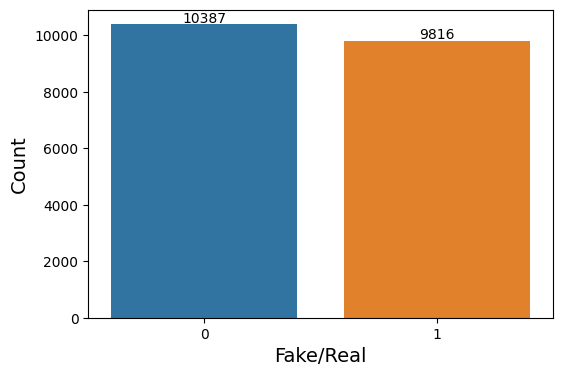

In [8]:
# Take a look at the number of fake vs. real articles
# to see if the dataset is balanced.
# As one can see from the output, it is relatively balanced
plt.figure(figsize=(6, 4))
count = df_kaggle.label.value_counts()
splot=sns.barplot(x=count.index,y=count)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 4), 
                   textcoords = 'offset points')
plt.xlabel("Fake/Real", size=14)
plt.ylabel("Count", size=14)
plt.xticks(rotation=0)
plt.show()

<a id='2.2-liar_dataset'></a>
### Data Exploration - Liar dataset

In [9]:
# Read the Liar dataset from file into a dataframe
df_liar = pd.read_csv("./Data/Liar/liar.csv")

In [10]:
# Take a look at the head to see what the columns look like
df_liar.head()

,label,text
0,fake,Says the Annies List political group supports ...
1,TRUE,When did the decline of coal start? It started...
2,TRUE,"Hillary Clinton agrees with John McCain ""by vo..."
3,fake,Health care reform legislation is likely to ma...
4,TRUE,The economic turnaround started at the end of ...


In [11]:
# And look at the information about the dataframe
df_liar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10269 entries, 0 to 10268
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   10269 non-null  object
 1   text    10269 non-null  object
dtypes: object(2)
memory usage: 160.6+ KB


In [12]:
# Check sto see if there are any null values
# There aren't any
df_liar.isnull().sum()

label    0
text     0
dtype: int64

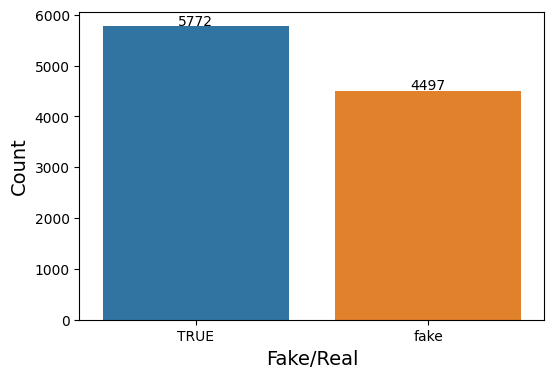

In [13]:
# Take a look at the number of fake vs. real articles
# to see if the dataset is balanced.
# It's not quite as balanced as the Kaggle dataset, but not bad
plt.figure(figsize=(6, 4))
count = df_liar.label.value_counts()
splot=sns.barplot(x=count.index,y=count)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 4), 
                   textcoords = 'offset points')
plt.xlabel("Fake/Real", size=14)
plt.ylabel("Count", size=14)
plt.xticks(rotation=0)
plt.show()

<a id='data_cleaning'></a>
# 3. Data Preparation and Cleaning

In [14]:
# Obtain the stopwords from nltk library
stop_words = stopwords.words('english')

In [15]:
# This function uses the in-built methods in the gensim library to clean the text
# This will be used to clean the text in the datasets
def clean_text(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 3 and token not in stop_words:
            result.append(token)
            
    return result

<a id='3.1-kaggle_dataset'></a>
### 3.1 Data preparation and cleaning - Kaggle dataset

In [16]:
# Apply the clean_text function to the text column of the Kaggle dataframe
# and create anew column called 'clean'
df_kaggle['clean'] = df_kaggle['text'].apply(clean_text)

In [17]:
# Show original text in the first row
df_kaggle['text'][0]

'House Dem Aide: We Didn’t Even See Comey’s Letter Until Jason Chaffetz Tweeted It By Darrell Lucus on October 30, 2016 Subscribe Jason Chaffetz on the stump in American Fork, Utah ( image courtesy Michael Jolley, available under a Creative Commons-BY license) \nWith apologies to Keith Olbermann, there is no doubt who the Worst Person in The World is this week–FBI Director James Comey. But according to a House Democratic aide, it looks like we also know who the second-worst person is as well. It turns out that when Comey sent his now-infamous letter announcing that the FBI was looking into emails that may be related to Hillary Clinton’s email server, the ranking Democrats on the relevant committees didn’t hear about it from Comey. They found out via a tweet from one of the Republican committee chairmen. \nAs we now know, Comey notified the Republican chairmen and Democratic ranking members of the House Intelligence, Judiciary, and Oversight committees that his agency was reviewing emai

In [18]:
# And show the cleaned up text after cleaning
print(df_kaggle['clean'][0])

['house', 'aide', 'comey', 'letter', 'jason', 'chaffetz', 'tweeted', 'darrell', 'lucus', 'october', 'subscribe', 'jason', 'chaffetz', 'stump', 'american', 'fork', 'utah', 'image', 'courtesy', 'michael', 'jolley', 'available', 'creative', 'commons', 'license', 'apologies', 'keith', 'olbermann', 'doubt', 'worst', 'person', 'world', 'week', 'director', 'james', 'comey', 'according', 'house', 'democratic', 'aide', 'looks', 'like', 'know', 'second', 'worst', 'person', 'turns', 'comey', 'sent', 'infamous', 'letter', 'announcing', 'looking', 'emails', 'related', 'hillary', 'clinton', 'email', 'server', 'ranking', 'democrats', 'relevant', 'committees', 'hear', 'comey', 'tweet', 'republican', 'committee', 'chairmen', 'know', 'comey', 'notified', 'republican', 'chairmen', 'democratic', 'ranking', 'members', 'house', 'intelligence', 'judiciary', 'oversight', 'committees', 'agency', 'reviewing', 'emails', 'recently', 'discovered', 'order', 'contained', 'classified', 'information', 'long', 'letter'

In [19]:
# Each individaul word is a string, so join all the 
# words into one big string
df_kaggle['clean_joined'] = df_kaggle['clean'].apply(lambda x: " ".join(x))

In [20]:
# Show clean_joined text for the first row
print(df_kaggle['clean_joined'][0])

house aide comey letter jason chaffetz tweeted darrell lucus october subscribe jason chaffetz stump american fork utah image courtesy michael jolley available creative commons license apologies keith olbermann doubt worst person world week director james comey according house democratic aide looks like know second worst person turns comey sent infamous letter announcing looking emails related hillary clinton email server ranking democrats relevant committees hear comey tweet republican committee chairmen know comey notified republican chairmen democratic ranking members house intelligence judiciary oversight committees agency reviewing emails recently discovered order contained classified information long letter went oversight committee chairman jason chaffetz political world ablaze tweet informed learned existence emails appear pertinent investigation case reopened jason chaffetz jasoninthehouse october course know case comey actually saying reviewing emails light unrelated case know 

<a id='3.2-liar_dataset'></a>
### 3.2 Data preparation and cleaning - Liar dataset

In [21]:
# Update the 'TRUE' and 'fake' text with 0 and 1 respectively
df_liar.replace(to_replace = 'TRUE', value = 0, inplace=True )
df_liar.replace(to_replace= 'fake', value = 1, inplace=True )

In [22]:
# Apply the clean_text function to the text column of the Liar dataframe
# and create anew column called 'clean'
df_liar['clean'] = df_liar['text'].apply(clean_text)

In [23]:
# Show original text in the first row
df_liar['text'][0]

'Says the Annies List political group supports third-trimester abortions on demand.'

In [24]:
# Show cleaned up text after cleaning
print(df_liar['clean'][0])

['says', 'annies', 'list', 'political', 'group', 'supports', 'trimester', 'abortions', 'demand']


In [25]:
# Each individaul word is a string, so join all the 
# words into one big string
df_liar['clean_joined'] = df_liar['clean'].apply(lambda x: " ".join(x))

In [26]:
# Show clean_joined text for the first row
print(df_liar['clean_joined'][0])

says annies list political group supports trimester abortions demand


<a id='data_visualization'></a>
# 4. Data Visualization

<a id='4.1-kaggle_dataset'></a>
### 4.1 Data visualization - Kaggle dataset

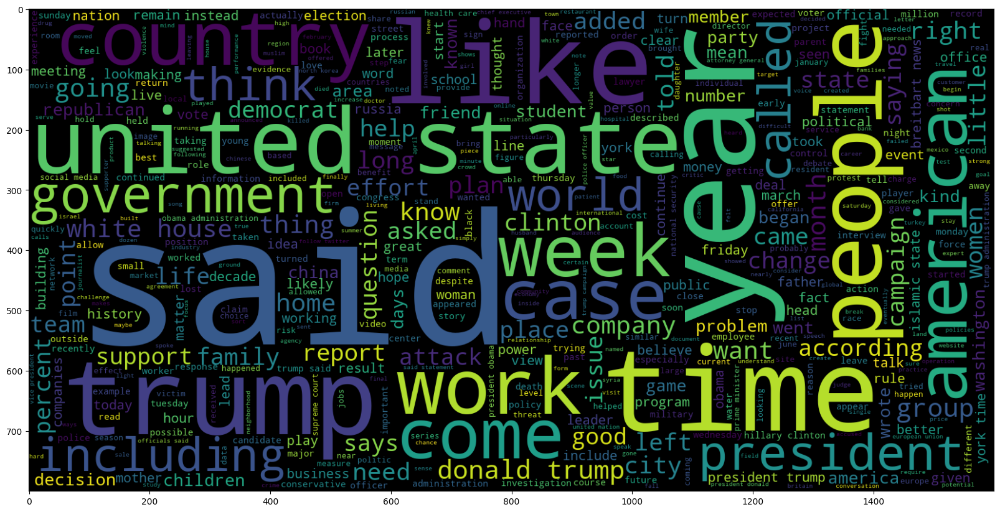

In [27]:
# Show a Wordcloud for text that is Real in the Kaggle dataset
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 500 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df_kaggle[df_kaggle.label == 0].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

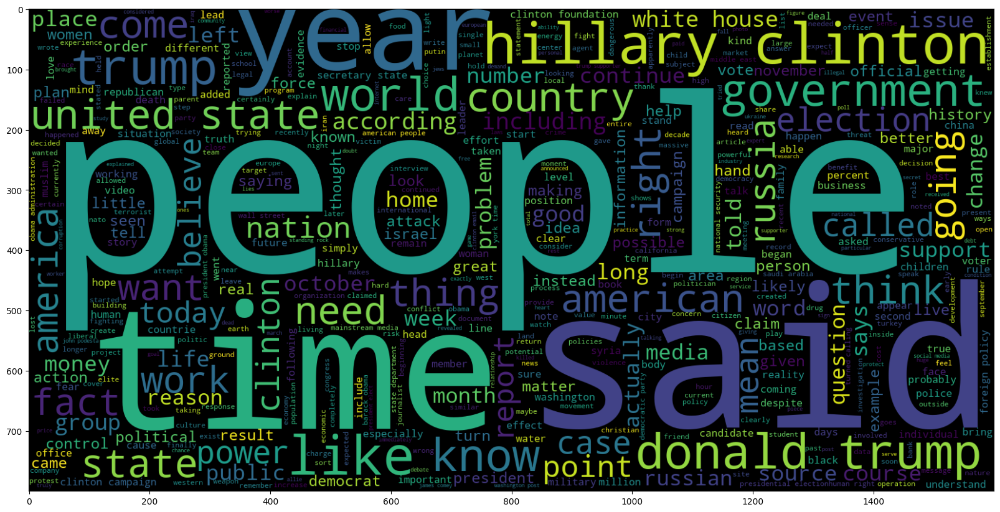

In [28]:
# Show a Wordcloud for text that is Fake in the Kaggle dataset
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 500 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df_kaggle[df_kaggle.label == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

In [29]:
# Show the distribution of number of words in the text in the Kaggle dataset
import plotly.express as px
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df_kaggle.clean_joined], nbins = 100)
fig.show()

<a id='4.2-liar_dataset'></a>
### 4.2 Data visualization - Liar dataset

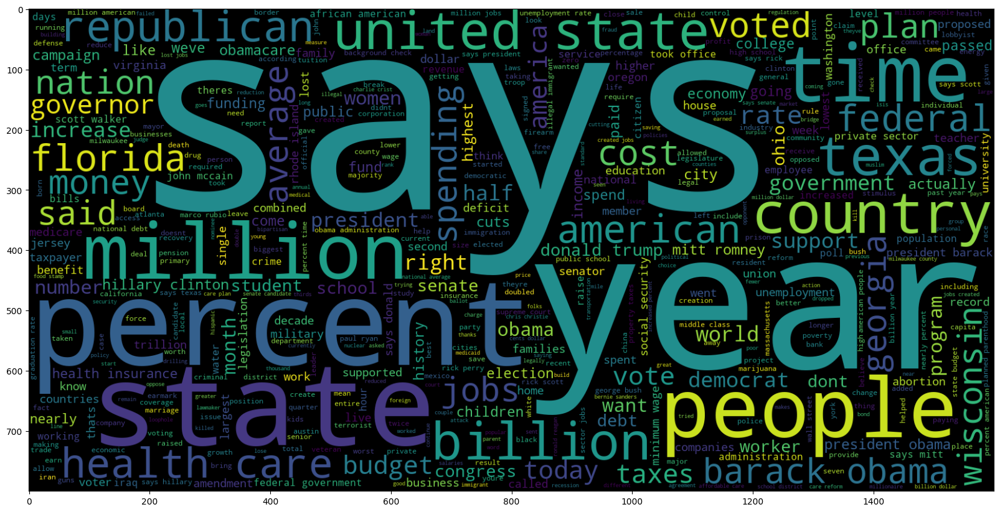

In [30]:
# Show a Wordcloud for text that is Real in the Liar dataset
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 500 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df_liar[df_liar.label == 0].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

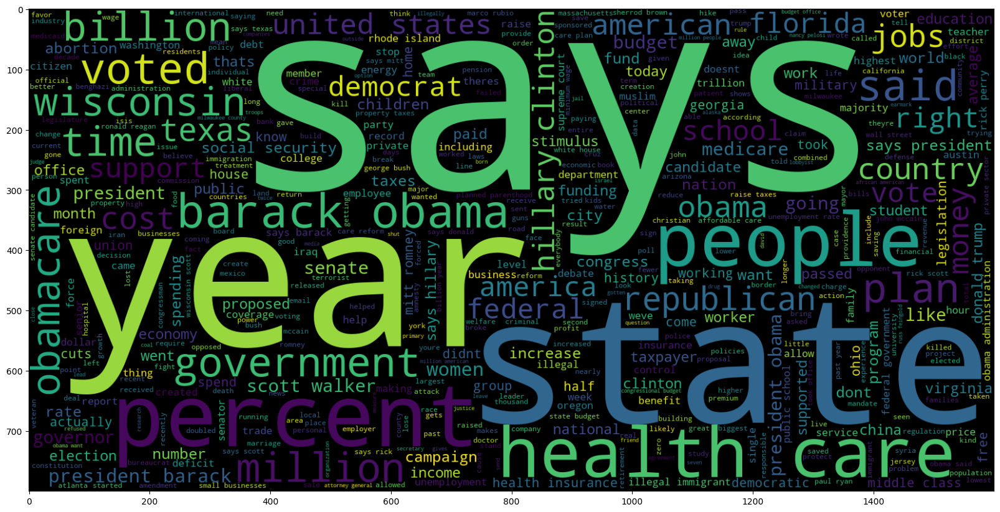

In [31]:
# Show a Wordcloud for text that is Fake in the Liar dataset
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 500 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df_liar[df_liar.label == 1].clean_joined))
plt.imshow(wc, interpolation = 'bilinear')

In [32]:
# Show the distribution of number of words in the text in the Liar dataset
import plotly.express as px
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df_liar.clean_joined], nbins = 100)
fig.show()

<a id='5.ml-no-meta-data'></a>
# 5. Machine Learning without meta-data

In [33]:
# This function is used to create a confusion matrix
# It is used a few times later for a nice visual display
# It is adapted from:
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Reds):
    fig, ax = plt.subplots(figsize=(5,5))
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    print('Confusion matrix, without normalization')

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [34]:
# This function is used to fit the model and display the metrics.
# It also shows the confusion matrix.
# It take a Scikit-learn ML classifier as the input parameter
def show_classifier_info(classifier):
    classifier.fit(X_train, y_train)

    # Get predicted results
    pred = classifier.predict(X_test)

    # And print the classification_report (precision, recall, f1-score)
    print(classification_report(y_test, pred,target_names=['FAKE', 'REAL']))   
    
    # And show the confusion matrix as well
    cm = metrics.confusion_matrix(y_test, pred)
    plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

<a id='5.1-Kaggle-full-cv'></a>
### 5.1 Kaggle full dataset with Count Vectorizer

In [35]:
# Vectorize the article text using the Count Vectorizer
# Using only the article text: df['clean_text_joined']
cv = CountVectorizer(max_features = 1000)

# Get the independent features
X = cv.fit_transform(df_kaggle['clean_joined']).toarray()

## Get the Dependent features
y = df_kaggle['label']

## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

              precision    recall  f1-score   support

        FAKE       0.82      0.88      0.85      2125
        REAL       0.86      0.79      0.82      1916

    accuracy                           0.84      4041
   macro avg       0.84      0.83      0.84      4041
weighted avg       0.84      0.84      0.84      4041

Confusion matrix, without normalization


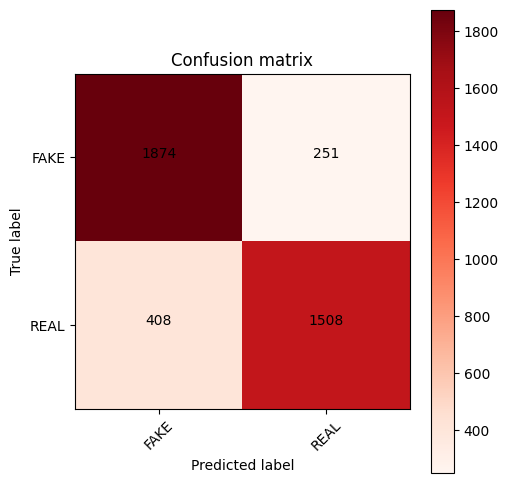

In [36]:
# Set the classifier to Naive Bayes
classifier=MultinomialNB()

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.92      0.91      0.92      2125
        REAL       0.90      0.91      0.91      1916

    accuracy                           0.91      4041
   macro avg       0.91      0.91      0.91      4041
weighted avg       0.91      0.91      0.91      4041

Confusion matrix, without normalization


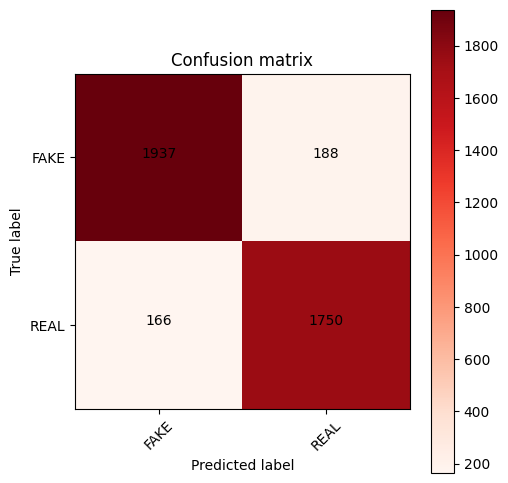

In [37]:
# Set the classifier to Support Vector Machine
classifier=SGDClassifier(loss='hinge',
                         penalty='l2',
                         alpha=1e-3,
                         random_state=42,
                         max_iter=10,
                         tol=None)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.92      0.91      0.92      2125
        REAL       0.90      0.91      0.91      1916

    accuracy                           0.91      4041
   macro avg       0.91      0.91      0.91      4041
weighted avg       0.91      0.91      0.91      4041

Confusion matrix, without normalization


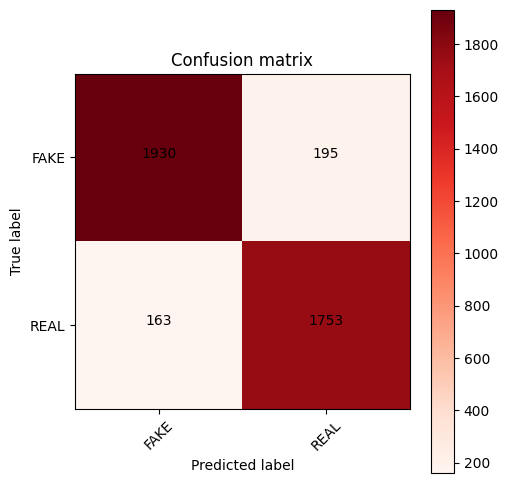

In [38]:
# Set the classifier to Logistic Regression
classifier=LogisticRegression(n_jobs=1, C=1e5, max_iter=5000)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.86      0.86      0.86      2125
        REAL       0.85      0.84      0.84      1916

    accuracy                           0.85      4041
   macro avg       0.85      0.85      0.85      4041
weighted avg       0.85      0.85      0.85      4041

Confusion matrix, without normalization


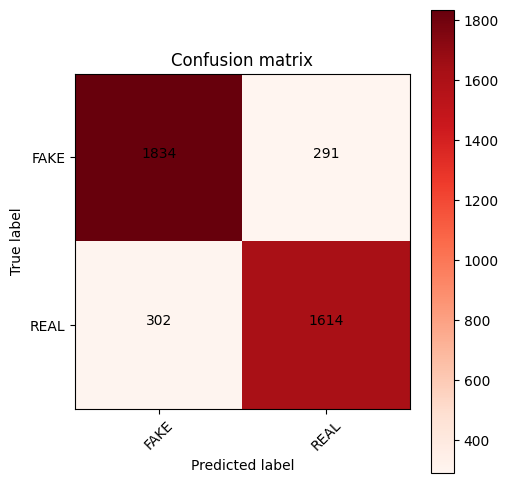

In [39]:
# Set the classifier to Decision Tree
classifier = tree.DecisionTreeClassifier(random_state=17)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

<a id='5.2-Kaggle-full-tfidf'></a>
### 5.2 Kaggle full dataset with TF-IDF

In [40]:
# Vectorize the article text using TF-IDF Vectorizer
# Using only the article text: df['clean_text_joined']
tfidf_v = TfidfVectorizer(max_features=2000,ngram_range=(1,3))

# Get the independent features
X = tfidf_v.fit_transform(df_kaggle['clean_joined']).toarray()

## Get the Dependent features
y = df_kaggle['label']

## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

              precision    recall  f1-score   support

        FAKE       0.84      0.90      0.87      2125
        REAL       0.88      0.80      0.84      1916

    accuracy                           0.86      4041
   macro avg       0.86      0.85      0.85      4041
weighted avg       0.86      0.86      0.86      4041

Confusion matrix, without normalization


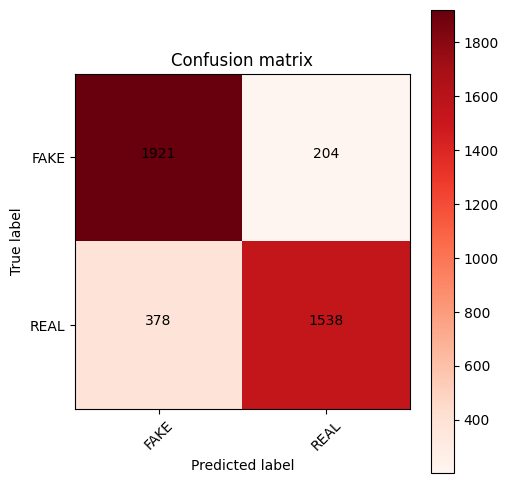

In [41]:
# Set the classifier to Naive Bayes
classifier=MultinomialNB()

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.93      0.90      0.91      2125
        REAL       0.89      0.92      0.91      1916

    accuracy                           0.91      4041
   macro avg       0.91      0.91      0.91      4041
weighted avg       0.91      0.91      0.91      4041

Confusion matrix, without normalization


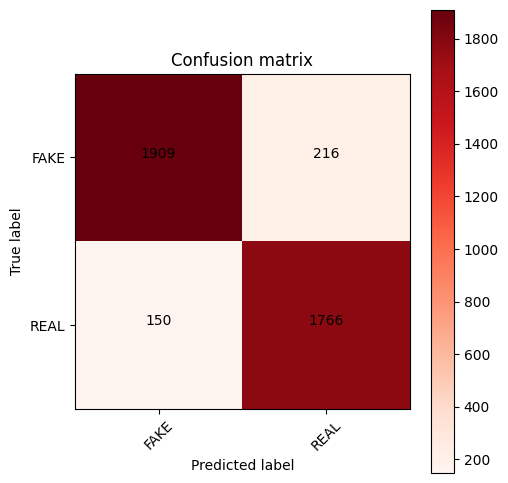

In [42]:
# Set the classifier to Support Vector Machine
classifier=SGDClassifier(loss='hinge',
                         penalty='l2',
                         alpha=1e-3,
                         random_state=42,
                         max_iter=10,
                         tol=None)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.90      0.90      0.90      2125
        REAL       0.89      0.88      0.89      1916

    accuracy                           0.89      4041
   macro avg       0.89      0.89      0.89      4041
weighted avg       0.89      0.89      0.89      4041

Confusion matrix, without normalization


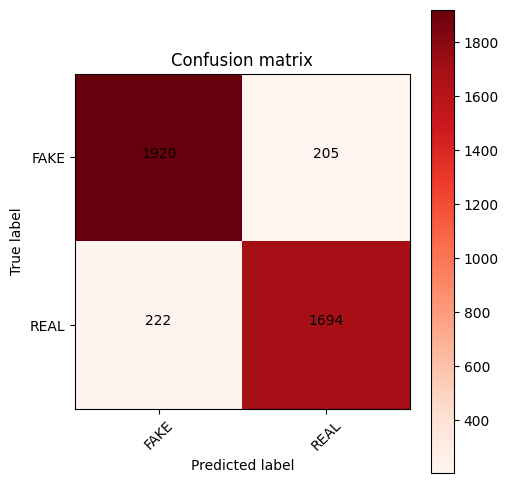

In [43]:
# Set the classifier to Logistic Regression
classifier=LogisticRegression(n_jobs=1, C=1e5, max_iter=5000)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.87      0.85      0.86      2125
        REAL       0.84      0.85      0.85      1916

    accuracy                           0.85      4041
   macro avg       0.85      0.85      0.85      4041
weighted avg       0.85      0.85      0.85      4041

Confusion matrix, without normalization


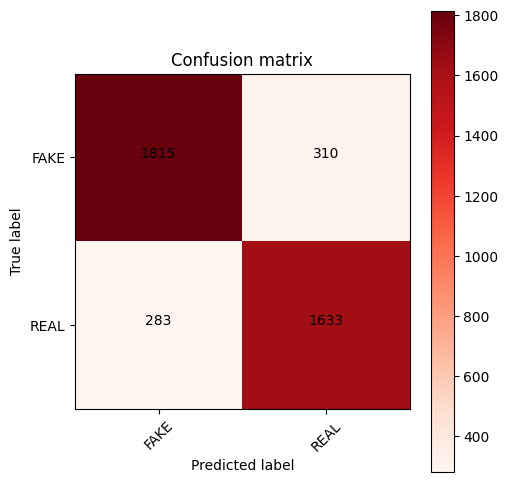

In [44]:
# Set the classifier to Decision Tree
classifier = tree.DecisionTreeClassifier(random_state=17)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

<a id='5.3-Liar-full-cv'></a>
### 5.3 Liar full dataset with Count Vectorizer

In [45]:
# Vectorize the article text using the Count Vectorizer
# Using only the article text: df['clean_text_joined']
cv = CountVectorizer(max_features = 1000)

# Get the independent features
X = cv.fit_transform(df_liar['clean_joined']).toarray()

## Get the Dependent features
y = df_liar['label']

## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

              precision    recall  f1-score   support

        FAKE       0.64      0.67      0.66      1175
        REAL       0.53      0.49      0.51       879

    accuracy                           0.60      2054
   macro avg       0.58      0.58      0.58      2054
weighted avg       0.59      0.60      0.59      2054

Confusion matrix, without normalization


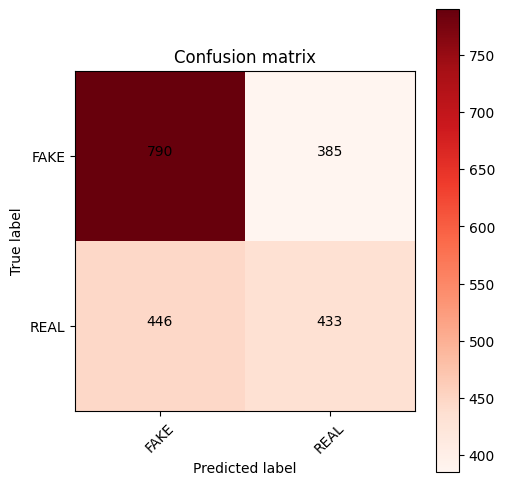

In [46]:
# Set the classifier to Naive Bayes
classifier=MultinomialNB()

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.66      0.62      0.64      1175
        REAL       0.53      0.57      0.55       879

    accuracy                           0.60      2054
   macro avg       0.60      0.60      0.60      2054
weighted avg       0.60      0.60      0.60      2054

Confusion matrix, without normalization


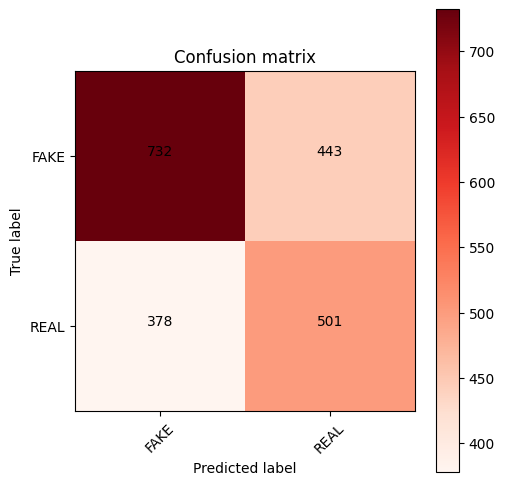

In [47]:
# Set the classifier to Support Vector Machine
classifier=SGDClassifier(loss='hinge',
                         penalty='l2',
                         alpha=1e-3,
                         random_state=42,
                         max_iter=10,
                         tol=None)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.64      0.67      0.66      1175
        REAL       0.53      0.49      0.51       879

    accuracy                           0.59      2054
   macro avg       0.58      0.58      0.58      2054
weighted avg       0.59      0.59      0.59      2054

Confusion matrix, without normalization


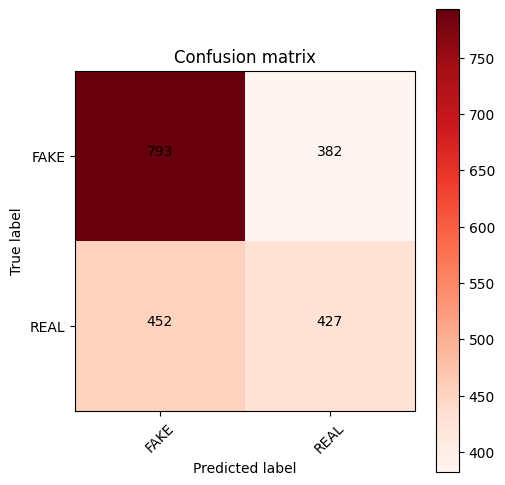

In [48]:
# Set the classifier to Logistic Regression
classifier=LogisticRegression(n_jobs=1, C=1e5, max_iter=5000)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.62      0.59      0.60      1175
        REAL       0.48      0.50      0.49       879

    accuracy                           0.56      2054
   macro avg       0.55      0.55      0.55      2054
weighted avg       0.56      0.56      0.56      2054

Confusion matrix, without normalization


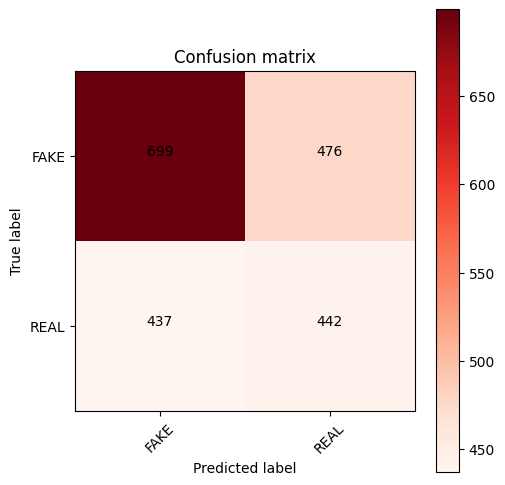

In [49]:
# Set the classifier to Decision Tree
classifier = tree.DecisionTreeClassifier(random_state=17)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

<a id='5.4-Liar-full-tfidf'></a>
### 5.4 Liar full dataset with TF-IDF

In [50]:
# Vectorize the article text using TF-IDF Vectorizer
# Using only the article text: df['clean_text_joined']
tfidf_v = TfidfVectorizer(max_features=2000,ngram_range=(1,3))

# Get the independent features
X = tfidf_v.fit_transform(df_liar['clean_joined']).toarray()

## Get the Dependent features
y = df_liar['label']

## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

              precision    recall  f1-score   support

        FAKE       0.62      0.74      0.67      1175
        REAL       0.53      0.39      0.45       879

    accuracy                           0.59      2054
   macro avg       0.57      0.57      0.56      2054
weighted avg       0.58      0.59      0.58      2054

Confusion matrix, without normalization


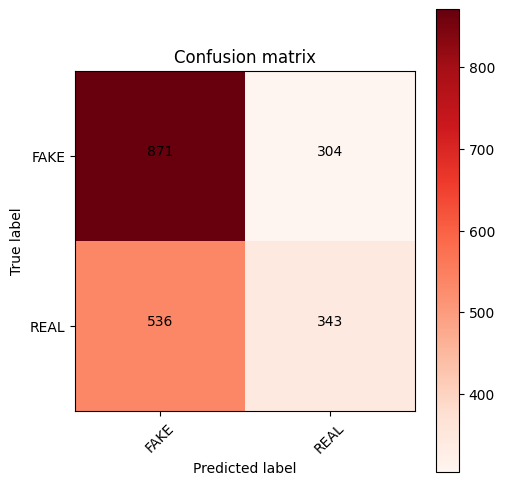

In [51]:
# Set the classifier to Naive Bayes
classifier=MultinomialNB()

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.61      0.86      0.71      1175
        REAL       0.59      0.26      0.36       879

    accuracy                           0.61      2054
   macro avg       0.60      0.56      0.54      2054
weighted avg       0.60      0.61      0.56      2054

Confusion matrix, without normalization


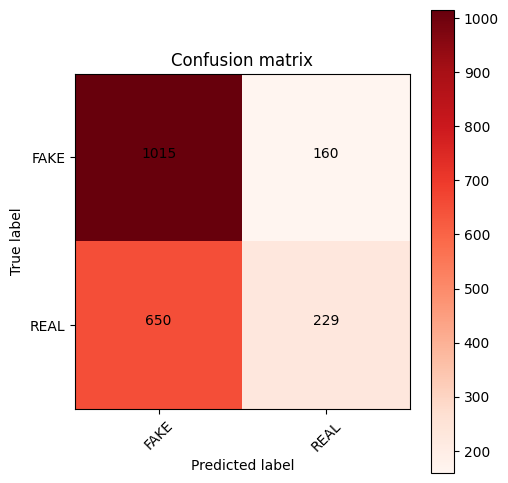

In [52]:
# Set the classifier to Support Vector Machine
classifier=SGDClassifier(loss='hinge',
                         penalty='l2',
                         alpha=1e-3,
                         random_state=42,
                         max_iter=10,
                         tol=None)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.61      0.62      0.61      1175
        REAL       0.48      0.46      0.47       879

    accuracy                           0.55      2054
   macro avg       0.54      0.54      0.54      2054
weighted avg       0.55      0.55      0.55      2054

Confusion matrix, without normalization


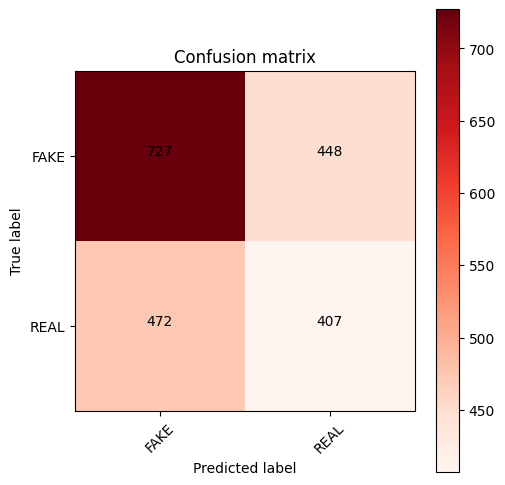

In [53]:
# Set the classifier to Logistic Regression
classifier=LogisticRegression(n_jobs=1, C=1e5, max_iter=5000)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

              precision    recall  f1-score   support

        FAKE       0.61      0.60      0.60      1175
        REAL       0.47      0.48      0.48       879

    accuracy                           0.55      2054
   macro avg       0.54      0.54      0.54      2054
weighted avg       0.55      0.55      0.55      2054

Confusion matrix, without normalization


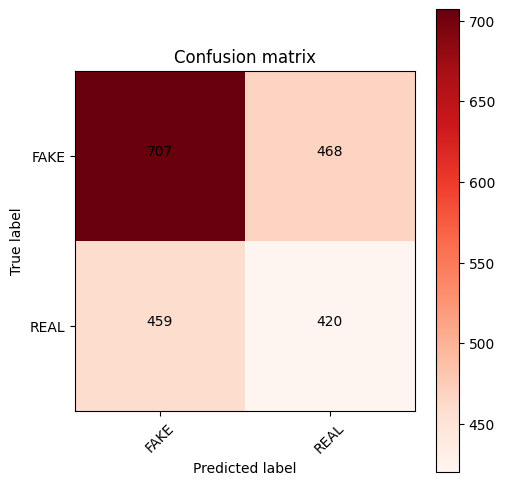

In [54]:
# Set the classifier to Decision Tree
classifier = tree.DecisionTreeClassifier(random_state=17)

# Fit the model and display the metrics and confusion matrix
show_classifier_info(classifier)

<a id='5.5-ML-full-results'></a>
### 5.5 Assessment of Machine Learning models without meta-data

<h3><center>Comparing Accuracy of ML models with different Vectorization methods on the Kaggle dataset</center></h3>

| ML Algorithm          | TF-IDF | Count Vectorizer |
|:----------------------|:------:|:----------------:|
| Naive Bayes           |  0.86  |       0.84       |
| Support Vector Machine|  0.91  |       0.91       |
| Logistic Regression   |  0.89  |       0.91       |
| Decision Tree         |  0.85  |       0.85       |

<h3><center>Comparing Accuracy of ML models with different Vectorization methods on the Liar dataset</center></h3>

| ML Algorithm          | TF-IDF | Count Vectorizer |
|:----------------------|:------:|:----------------:|
| Naive Bayes           |  0.59  |       0.60       |
| Support Vector Machine|  0.61  |       0.60       |
| Logistic Regression   |  0.55  |       0.59       |
| Decision Tree         |  0.55  |       0.56       |

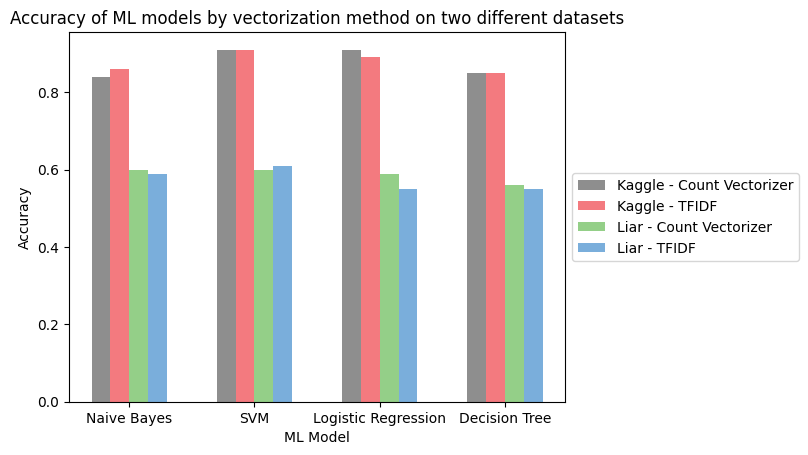

In [55]:
# Plot the data
n_groups = 4
kaggle_cv = (0.84, 0.91, 0.91, 0.85)
kaggle_tfidf = (0.86, 0.91, 0.89, 0.85)
liar_cv = (0.60, 0.60, 0.59, 0.56)
liar_tfidf = (0.59, 0.61, 0.55, 0.55)


# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.15
opacity = 0.8

rects1 = plt.bar(index, kaggle_cv, bar_width, alpha=opacity, color='#727272', label='Kaggle - Count Vectorizer')
rects2 = plt.bar(index + bar_width, kaggle_tfidf, bar_width,alpha=opacity,color='#f1595f',label='Kaggle - TFIDF')
rects3 = plt.bar(index + bar_width * 2, liar_cv, bar_width,alpha=opacity,color='#79c36a',label='Liar - Count Vectorizer')
rects4 = plt.bar(index + bar_width * 3, liar_tfidf, bar_width,alpha=opacity,color='#599ad3',label='Liar - TFIDF')

plt.xlabel('ML Model')
plt.ylabel('Accuracy')
plt.title('Accuracy of ML models by vectorization method on two different datasets')
plt.xticks(index + bar_width *1.5, ('Naive Bayes', 'SVM', 'Logistic Regression', 'Decision Tree'))
plt.legend()

# Put the legend to the right of the graph
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


# plt.tight_layout()
plt.show()

<a id='6.-nn-no-meta-data'></a>
# 6. Neural Network without meta-data

<a id='6.1-kaggle-dataset'></a>
### 6.1 Neural Network with Kaggle Dataset

In [56]:
# split data into test and train datasets
X_train, X_test, y_train, y_test = train_test_split(df_kaggle.clean_joined, df_kaggle.label, test_size = 0.2)

In [57]:
# Obtain the total words present in the dataset
list_of_words = []
for i in df_kaggle.clean:
    for j in i:
        list_of_words.append(j)

In [58]:
# Obtain the total number of unique words
total_words = len(list(set(list_of_words)))
total_words

167709

In [59]:
# Create a tokenizer to tokenize the words and create sequences of tokenized words
tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(X_train)
train_sequences = tokenizer.texts_to_sequences(X_train)
test_sequences = tokenizer.texts_to_sequences(X_test)

In [60]:
# Add padding
padded_train = pad_sequences(train_sequences, maxlen = 100, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences, maxlen = 100, truncating = 'post')

In [61]:
# Sequential Model
model = Sequential()

# embeddidng layer
model.add(Embedding(total_words, output_dim = 64))

# Bi-Directional RNN and LSTM
model.add(Bidirectional(LSTM(128)))

# Dense layers
model.add(Dense(128, activation = 'relu'))
model.add(Dense(1,activation= 'sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 64)          10733376  
                                                                 
 bidirectional (Bidirectiona  (None, 256)              197632    
 l)                                                              
                                                                 
 dense (Dense)               (None, 128)               32896     
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 10,964,033
Trainable params: 10,964,033
Non-trainable params: 0
_________________________________________________________________


In [62]:
y_train = np.asarray(y_train)

In [63]:
# train the model
model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)

Epoch 1/2
228/228 [==============================] - 83s 343ms/step - loss: 0.2911 - acc: 0.8732 - val_loss: 0.1557 - val_acc: 0.9400
Epoch 2/2
228/228 [==============================] - 88s 385ms/step - loss: 0.0533 - acc: 0.9818 - val_loss: 0.1824 - val_acc: 0.9301


In [64]:
# make prediction
pred = model.predict(padded_test)

127/127 [==============================] - 8s 50ms/step


In [65]:
# if the predicted value is > 0.5 it is fake else it is real
prediction = []
for i in range(len(pred)):
    if pred[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)

In [66]:
accuracy = accuracy_score(list(y_test), prediction)

print("Model Accuracy : ", accuracy)

Model Accuracy :  0.9106656768126701


<AxesSubplot:>

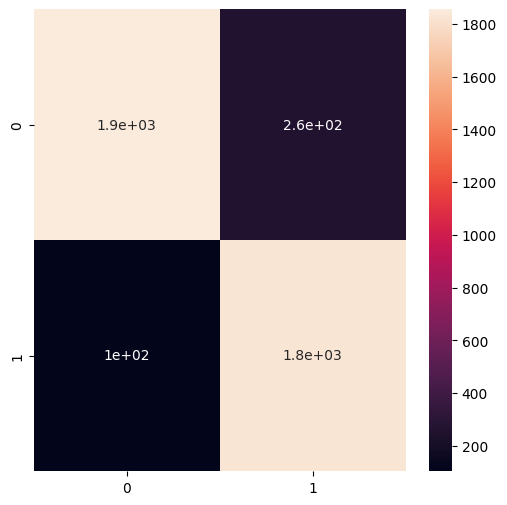

In [67]:
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (6, 6))
sns.heatmap(cm, annot = True)

<a id='6.2-liar-dataset'></a>
### 6.2 Neural Network with Liar Dataset

In [68]:
# split data into test and train 
x_train, x_test, y_train, y_test = train_test_split(df_liar.clean_joined, df_liar.label, test_size = 0.2)

In [69]:
# Obtain the total words present in the dataset
list_of_words = []
for i in df_liar.clean:
    for j in i:
        list_of_words.append(j)

In [70]:
# Obtain the total number of unique words
total_words = len(list(set(list_of_words)))
total_words

10773

In [71]:
# Create a tokenizer to tokenize the words and create sequences of tokenized words
tokenizer = Tokenizer(num_words = total_words)
tokenizer.fit_on_texts(x_train)
train_sequences = tokenizer.texts_to_sequences(x_train)
test_sequences = tokenizer.texts_to_sequences(x_test)

In [72]:
# Add padding
padded_train = pad_sequences(train_sequences,maxlen = 40, padding = 'post', truncating = 'post')
padded_test = pad_sequences(test_sequences,maxlen = 40, truncating = 'post') 

In [73]:
y_train = np.asarray(y_train)

In [74]:
# train the model
model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)

Epoch 1/2
116/116 [==============================] - 30s 237ms/step - loss: 0.7192 - acc: 0.5544 - val_loss: 0.6840 - val_acc: 0.5681
Epoch 2/2
116/116 [==============================] - 27s 229ms/step - loss: 0.6852 - acc: 0.5634 - val_loss: 0.6838 - val_acc: 0.5681


In [75]:
# make prediction
pred = model.predict(padded_test)

65/65 [==============================] - 2s 16ms/step


In [76]:
# if the predicted value is > 0.5 it is fake else it is real
prediction = []
for i in range(len(pred)):
    if pred[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)

In [77]:
accuracy = accuracy_score(list(y_test), prediction)

print("Model Accuracy : ", accuracy)

Model Accuracy :  0.555014605647517


<AxesSubplot:>

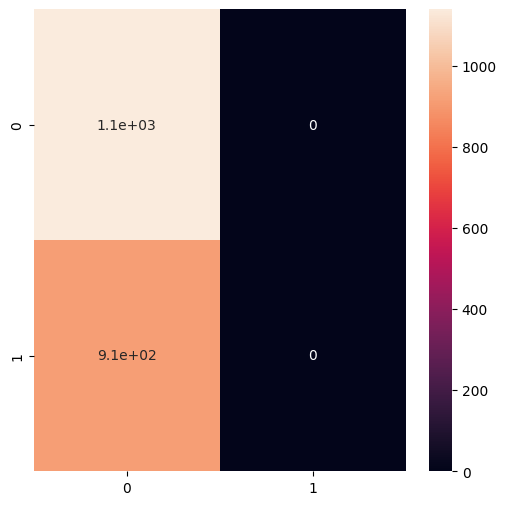

In [78]:
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (6, 6))
sns.heatmap(cm, annot = True)

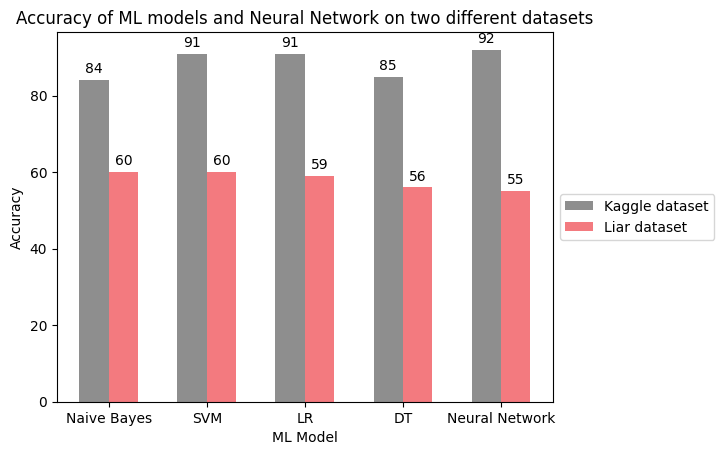

In [79]:
# Plot the average ML accuracy and the accuracy of the Neural Network
n_groups = 5
kaggle = (84, 91, 91, 85, 92)
liar = (60, 60, 59, 56, 55)

# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.3
opacity = 0.8

rects1 = plt.bar(index, kaggle, bar_width, alpha=opacity, color='#727272', label='Kaggle dataset')
rects2 = plt.bar(index + bar_width, liar, bar_width,alpha=opacity,color='#f1595f',label='Liar dataset')

plt.xlabel('ML Model')
plt.ylabel('Accuracy')
plt.title('Accuracy of ML models and Neural Network on two different datasets')
plt.xticks(index + bar_width/2, ('Naive Bayes', 'SVM', 'LR', 'DT', 'Neural Network'))
plt.legend()

# Put the legend to the right of the graph
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


ax.bar_label(rects1, padding=3)
ax.bar_label(rects2, padding=3)


plt.show()

<a id='7.-web-scrape-meta-data'></a>
# 7. Web scraping for meta-data

### * This section was used for searching and web scraping
#### * I have commented out this code because running this section can take several days!
#### * I have exported the final datasets as csv files and will import them below

In [80]:
"""
This function gets a list of URL's by doing
a Google search on the 'textToSearch' input parameter.
It returns a list of the top 5 URL's. The function also
has to pause between searches in order for Google not
to automatically block the IP address - I found this out
the hard way!
"""

# def GetUrls(textToSearch):
#     urls = []
#     try:
#         for i in search(textToSearch, tld="com", num=5, stop=5, pause=3):
#             urls.append(i)

#     except:
#         pass
        
#     return urls

"\nThis function gets a list of URL's by doing\na Google search on the 'textToSearch' input parameter.\nIt returns a list of the top 5 URL's. The function also\nhas to pause between searches in order for Google not\nto automatically block the IP address - I found this out\nthe hard way!\n"

In [81]:
"""
This function gets the content from the URL passed to it.
It uses the Chrome webdriver to retreive the webpage 
and then uses BeautifulSoup to parse the page to get the title and headings.
It returns 4 lists, one for each ot title, h1, h2 and h3.
"""
# def GetContent(urlsList):
    
#     web_page_title = []
#     h1 = []
#     h2 = []
#     h3 = []

#     for url in urlsList:
#         driver = webdriver.Chrome(options=options, chrome_options=chrome_options, service=s)
#         try:
#             driver.set_page_load_timeout(15)
#             driver.get(url)   
#             soup = BeautifulSoup(driver.page_source, 'html.parser')
            
#             # Get the title
#             for title in soup.find_all('title'):
#                 web_page_title.append(title.get_text())

#             heading_tags = ["h1", "h2", "h3"]
#             for tags in soup.find_all(heading_tags):

#                 if tags.name == 'h1':
#                     h1.append(tags.text.strip())

#                 elif tags.name == 'h2':
#                     h2.append(tags.text.strip())

#                 elif tags.name == 'h3':
#                     h3.append(tags.text.strip())

#         except:
#             print("URL Failed: ", url)
        
#         finally:
#             driver.quit()

#     contentList = [web_page_title, h1, h2, h3]
#     return pd.Series(contentList)

'\nThis function gets the content from the URL passed to it.\nIt uses the Chrome webdriver to retreive the webpage \nand then uses BeautifulSoup to parse the page to get the title and headings.\nIt returns 4 lists, one for each ot title, h1, h2 and h3.\n'

In [82]:
"""
Get a list of URL's and add them to the dataframe.
For the Kaggle dataset, it searches using the title.
"""

# df_kaggle['urls'] = df.apply(lambda row: GetUrls(row['title']), axis = 1)

"\nGet a list of URL's and add them to the dataframe.\nFor the Kaggle dataset, it searches using the title.\n"

In [83]:
"""
Get a list of URL's and add them to the dataframe.
For the Liar dataset, it searches using the title.
"""

# df_liar['urls'] = df.apply(lambda row: GetUrls(row['text']), axis = 1)

"\nGet a list of URL's and add them to the dataframe.\nFor the Liar dataset, it searches using the title.\n"

In [84]:
"""
Get the meta-data for the Kaggle dataset.
"""
# df_kaggle[['web_page_title', 'h1', 'h2', 'h3']] = [GetContent(x) for x in df_kaggle['urls']]

'\nGet the meta-data for the Kaggle dataset.\n'

In [85]:
"""
Get the meta-data for the Kaggle dataset.
"""
# df_liar[['web_page_title', 'h1', 'h2', 'h3']] = [GetContent(x) for x in df_liar['urls']]

'\nGet the meta-data for the Kaggle dataset.\n'

<a id='8.ml-with-meta-data'></a>
# 8. Machine Learning with meta-data

<a id='8.1-preprocess'></a>
### 8.1 Preprocessing the datasets

In [86]:
# get the datasets with the meta-data
df_liar = pd.read_csv("./Data/Liar/liar_with_meta_data.csv")
df_kaggle = pd.read_csv("./Data/Kaggle/kaggle_with_meta_data.csv")

In [87]:
# Take a look at the meta-data in the dataset
df_liar.head()

,Unnamed: 0,index,label,text,urls,web_page_title,h1,h2,h3
0,0,0,0,Says Paul Ryan is still endorsing Trump.,['https://www.washingtonpost.com/politics/trum...,['Paul Ryan endorses Donald Trump - The Washin...,"['Paul Ryan endorses Donald Trump', 'Paul Ryan...",['The Electoral Map Looks Challenging for Trum...,"['Politics', 'Politics', 'Trump University Pro..."
1,1,1,0,We cut business taxes so today 70 percent of o...,['https://taxsummaries.pwc.com/uganda/corporat...,['Uganda - Corporate - Taxes on corporate inco...,"['Uganda', 'Rethinking the Incidence of the Co...","['Corporate - Taxes on corporate income', 'Res...","['Uganda contacts', 'Uganda publications and s..."
2,2,2,0,Says Mark Pryor votes with Obama 93 percent of...,['https://www.politifact.com/factchecks/2014/o...,"['Access Denied', 'Pryor slams Cotton for ambi...","['Access Denied', 'POLITICO\nPolitico Logo', '...","['SECTIONS', 'Elections', 'SERIES', 'The Excha...","['Manage Consent Preferences', 'Performance Co..."
3,3,0,0,Point Pleasant Beach does not own its beaches;...,['https://www.politifact.com/factchecks/2011/s...,"['Just a moment...', 'Point Pleasant Beach, Ne...",['Please turn JavaScript on and reload the pag...,"['Contents', 'History[edit]', 'Geography[edit]...","['Census 2010[edit]', 'Census 2000[edit]', 'Lo..."
4,4,1,0,Says Rep. Jim Weidner proposed a bill taking a...,['https://www.politifact.com/factchecks/list/?...,['Rep. Jim Weidner :: Your Government - The Or...,"['Rep. Jim Weidner R-Yamhill', '', 'Score +1 f...",['Votes Resolution and memorial votes in gray'...,"['Cookie Categories', 'Performance Cookies', '..."


In [88]:
# Take a look at the meta-data in the dataset
df_kaggle.head()

,Unnamed: 0,index,id,title,author,text,label,urls,web_page_title,h1,h2,h3
0,0,0,1149,Williams Sisters Could Be in Step for Semifina...,Ben Rothenberg,If the Williams sisters are to face off in Art...,0,['https://www.nytimes.com/2018/08/23/sports/te...,['U.S. Open Draw Sets Up a Possible Early Meet...,['U.S. Open Draw Sets Up a Possible Early Meet...,"['What’s New, and What’s Free, at the 2018 U.S...","['Related Coverage', 'With Tennis Style, It’s ..."
1,1,1,1150,Art Underground: A First Look at the Second Av...,Randy Kennedy,When a city has been waiting for a badly neede...,0,['https://www.nytimes.com/2016/12/19/arts/desi...,['Art Underground: A First Look at the Second ...,['Art Underground: A First Look at the Second ...,"['Site Information Navigation', 'New York Time...","['December 19, 2016']"
2,2,3,1153,N.C. Trooper Investigated in Fatal Shooting of...,Liam Stack,The North Carolina State Bureau of Investigati...,0,['https://www.nytimes.com/2016/08/25/us/nc-tro...,['N.C. Trooper Investigated in Fatal Shooting ...,['N.C. Trooper Investigated in Fatal Shooting ...,"['Vigil for Deaf Man Shot by Police', 'More in...",['Drop Box for Babies: Conservatives Promote a...
3,3,4,1154,Families and Fellow Officers Honor Victims of ...,John Eligon and Patrick McGee,"DALLAS — From a young age, Brent Thompson p...",0,['https://www.nytimes.com/2016/07/14/us/dallas...,['Families and Fellow Officers Honor Victims o...,['Families and Fellow Officers Honor Victims o...,['Dallas Police Are Used to Recovering From Be...,"['Related Coverage', 'Progressives Embrace Cli..."
4,4,5,1155,Exclusive — Sarah Palin on Paul Ryan’s ‘RINO-C...,Matthew Boyle,"Former Alaska Gov. Sarah Palin, the 2008 Repub...",0,['https://www.breitbart.com/politics/2017/03/1...,['Salisbury News: Exclusive — Sarah Palin on P...,['Sarah Palin vows to unseat Paul Ryan over hi...,"['Attention', 'Tuesday, March 14, 2017', 'Foll...",['Exclusive — Sarah Palin on Paul Ryan’s ‘RINO...


In [89]:
# This function creates a dataset of length of num_samples
# for each of fake news and real news, for both Kaggle and Liar datasets
def CreateDatasetsWithMetaData(num_samples):
    # get the datasets with the meta-data
    df_liar = pd.read_csv("./Data/Liar/liar_with_meta_data.csv")
    df_kaggle = pd.read_csv("./Data/Kaggle/kaggle_with_meta_data.csv")

    # create a dataset with num_samples fake and num_samples real 
    # news stories for the Kaggle dataset
    df_true = df_kaggle[df_kaggle.label == 0 ]
    df_fake = df_kaggle[df_kaggle.label == 1 ]
    df_true=df_true.iloc[:num_samples,:]
    df_fake=df_fake.iloc[:num_samples,:]

    # Concatenate Real and Fake News
    df_kaggle = pd.concat([df_true, df_fake]).reset_index(drop = True)
    
    # create a dataset with 1000 fake and 1000 real 
    # news stories for Liar dataset
    df_true = df_liar[df_liar.label == 0 ]
    df_fake = df_liar[df_liar.label == 1 ]
    df_true=df_true.iloc[:num_samples,:]
    df_fake=df_fake.iloc[:num_samples,:]

    # Concatenate Real and Fake News
    df_liar = pd.concat([df_true, df_fake]).reset_index(drop = True)    

    # Apply the preprocess function to both the Kaggle and Liar dataframes
    df_liar['clean_text'] = df_liar['text'].apply(clean_text)
    df_kaggle['clean_text'] = df_kaggle['text'].apply(clean_text)

    # join the words into a string
    df_liar['clean_text_joined'] = df_liar['clean_text'].apply(lambda x: " ".join(x))
    df_kaggle['clean_text_joined'] = df_kaggle['clean_text'].apply(lambda x: " ".join(x))
    
    # Clean the 'web_page_title' data and combine it with the 'text' data
    # Run the Preprocess function on the 'web_page_title' column
    df_liar['clean_web_page_title'] = df_liar['web_page_title'].apply(clean_text)
    df_kaggle['clean_web_page_title'] = df_kaggle['web_page_title'].apply(clean_text)

    # join the words into a string
    df_liar['clean_web_page_title_joined'] = df_liar['clean_web_page_title'].apply(lambda x: " ".join(x))
    df_kaggle['clean_web_page_title_joined'] = df_kaggle['clean_web_page_title'].apply(lambda x: " ".join(x))

    # And combine the 'text' and 'web_page_title' columns
    df_liar["clean_text_title"] = df_liar["clean_text_joined"] + ' ' + df_liar["clean_web_page_title_joined"]
    df_kaggle["clean_text_title"] = df_kaggle["clean_text_joined"] + ' ' + df_kaggle["clean_web_page_title_joined"]
    
    # Clean the 'h1' data and combine it with the 'text' and 'web_page_title'  data
    # Run the Preprocess function on the 'h1' column
    df_liar['clean_h1'] = df_liar['h1'].apply(clean_text)
    df_kaggle['clean_h1'] = df_kaggle['h1'].apply(clean_text)

    # join the words into a string
    df_liar['clean_h1_joined'] = df_liar['clean_h1'].apply(lambda x: " ".join(x))
    df_kaggle['clean_h1_joined'] = df_kaggle['clean_h1'].apply(lambda x: " ".join(x))

    # And combine the 'text', 'web_page_title' and 'h1' columns
    df_liar["clean_text_title_h1"] = df_liar["clean_text_title"] + ' ' + df_liar["clean_h1_joined"]
    df_kaggle["clean_text_title_h1"] = df_kaggle["clean_text_title"] + ' ' + df_kaggle["clean_h1_joined"]

    # Clean the 'h2' data and combine it with the 'text', 'web_page_title' and 'h1' data
    # Run the Preprocess function on the 'h2' column
    df_liar['clean_h2'] = df_liar['h2'].apply(clean_text)
    df_kaggle['clean_h2'] = df_kaggle['h2'].apply(clean_text)

    # join the words into a string
    df_liar['clean_h2_joined'] = df_liar['clean_h2'].apply(lambda x: " ".join(x))
    df_kaggle['clean_h2_joined'] = df_kaggle['clean_h2'].apply(lambda x: " ".join(x))

    # And combine the 'text', 'web_page_title', 'h1' and 'h2' columns
    df_liar["clean_text_title_h1_h2"] = df_liar["clean_text_title_h1"] + ' ' + df_liar["clean_h2_joined"]
    df_kaggle["clean_text_title_h1_h2"] = df_kaggle["clean_text_title_h1"] + ' ' + df_kaggle["clean_h2_joined"]

    # Clean the 'h3' data and combine it with the 'text', 'web_page_title', 'h1' and 'h2' data
    # Run the Preprocess function on the 'h2' column
    df_liar['clean_h3'] = df_liar['h3'].astype(str).apply(clean_text)
    df_kaggle['clean_h3'] = df_kaggle['h3'].astype(str).apply(clean_text)

    # join the words into a string
    df_liar['clean_h3_joined'] = df_liar['clean_h3'].apply(lambda x: " ".join(x))
    df_kaggle['clean_h3_joined'] = df_kaggle['clean_h3'].apply(lambda x: " ".join(x))

    # And combine the 'text', 'web_page_title', 'h1', 'h2' and 'h3' columns
    df_liar["clean_text_title_h1_h2_h3"] = df_liar["clean_text_title_h1_h2"] + ' ' + df_liar["clean_h3_joined"]
    df_kaggle["clean_text_title_h1_h2_h3"] = df_kaggle["clean_text_title_h1_h2"] + ' ' + df_kaggle["clean_h3_joined"]

    return df_kaggle, df_liar
    
    

In [90]:
# This function is used to fit the model and
# return the accuracy.
def get_accuracy(classifier, X_trn, X_tst, y_trn, y_tst):
    classifier.fit(X_trn, y_trn)
    
    return round(accuracy_score(y_tst, classifier.predict(X_tst)),2)

In [91]:
# This is a list of the ML models to evaluate
models = []
models.append(('NB', MultinomialNB()))
models.append(('SVM', SVC()))
models.append(('LR', LogisticRegression(n_jobs=1, C=1e5, max_iter=5000)))
models.append(('DT', tree.DecisionTreeClassifier(random_state=17)))

In [92]:
def ShowAllKaggleResults(num_samples):
    df_kaggle, df_liar = CreateDatasetsWithMetaData(num_samples)

    # Vectorize the article text using the Count Vectorizer
    # Using only the article text: df['clean_text_joined']
    cv = CountVectorizer(max_features = 1000)

    # Get the Independent features for the text only
    X_text_only = cv.fit_transform(df_kaggle['clean_text_joined']).toarray()
    # Get the Dependent features
    y = df_kaggle['label']
    # Divide the dataset into Train and Test for the text only
    X_train_text_only, X_test_text_only, y_train_text_only, y_test_text_only = train_test_split(X_text_only, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text and title
    X_text_title = cv.fit_transform(df_kaggle['clean_text_title']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title, X_test_text_title, y_train_text_title, y_test_text_title = train_test_split(X_text_title, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title and heading1
    X_text_title_h1 = cv.fit_transform(df_kaggle['clean_text_title_h1']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1, X_test_text_title_h1, y_train_text_title_h1, y_test_text_title_h1 = train_test_split(X_text_title_h1, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title, heading1 and heading 2
    X_text_title_h1_h2 = cv.fit_transform(df_kaggle['clean_text_title_h1_h2']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1_h2, X_test_text_title_h1_h2, y_train_text_title_h1_h2, y_test_text_title_h1_h2 = train_test_split(X_text_title_h1_h2, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title and all headings
    X_text_title_h1_h2_h3 = cv.fit_transform(df_kaggle['clean_text_title_h1_h2_h3']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1_h2_h3, X_test_text_title_h1_h2_h3, y_train_text_title_h1_h2_h3, y_test_text_title_h1_h2_h3 = train_test_split(X_text_title_h1_h2_h3, y, test_size=0.2, random_state=0)

    print("Results for", num_samples, "Kaggle articles...")

    model_names = []
    print("Accuracy for text only")
    accuracy_text_only = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_only, X_test_text_only, y_train_text_only, y_test_text_only)
        accuracy_text_only.append(accuracy)
        model_names.append(model_name)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text and title")
    accuracy_text_title = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title, X_test_text_title, y_train_text_title, y_test_text_title)
        accuracy_text_title.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and heading 1 data")
    accuracy_text_title_h1 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1, X_test_text_title_h1, y_train_text_title_h1, y_test_text_title_h1)
        accuracy_text_title_h1.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and headings 1 and 2")
    accuracy_text_title_h1_h2 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1_h2, X_test_text_title_h1_h2, y_train_text_title_h1_h2, y_test_text_title_h1_h2)
        accuracy_text_title_h1_h2.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and all heading data")
    accuracy_text_title_h1_h2_h3 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1_h2_h3, X_test_text_title_h1_h2_h3, y_train_text_title_h1_h2_h3, y_test_text_title_h1_h2_h3)
        accuracy_text_title_h1_h2_h3.append(accuracy)
        print(model_name, ": ", accuracy)

    n_groups = 4

    # create plot
    fig, ax = plt.subplots()
    index = np.arange(n_groups)
    bar_width = 0.15
    opacity = 0.8

    rects1 = plt.bar(index, accuracy_text_only, bar_width, alpha=opacity, color='#727272', label='No meta-data')
    rects2 = plt.bar(index + bar_width, accuracy_text_title, bar_width,alpha=opacity,color='#f1595f', label='Title')
    rects3 = plt.bar(index + bar_width * 2, accuracy_text_title_h1, bar_width,alpha=opacity,color='#79c36a',label='Title + h1')
    rects4 = plt.bar(index + bar_width * 3, accuracy_text_title_h1_h2, bar_width,alpha=opacity,color='#599ad3', label='Title + h1 + h2')
    rects5 = plt.bar(index + bar_width * 4, accuracy_text_title_h1_h2_h3, bar_width,alpha=opacity,color='#f9a65a', label='Title + h1 + h2 _ h3')

    plt.xlabel('ML Algorithm')
    plt.ylabel('Accuracy')
    plt.title('Kaggle dataset - Accuracy by ML algorithm and amount of meta-data')
    plt.xticks(index + bar_width * 2, model_names)
    # plt.legend()

    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # plt.tight_layout()
    plt.show()


In [93]:
def ShowAllLiarResults(num_samples):
    df_liar, df_liar = CreateDatasetsWithMetaData(num_samples)

    # Vectorize the article text using the Count Vectorizer
    # Using only the article text: df['clean_text_joined']
    cv = CountVectorizer(max_features = 1000)

    # Get the Independent features for the text only
    X_text_only = cv.fit_transform(df_liar['clean_text_joined']).toarray()
    # Get the Dependent features
    y = df_liar['label']
    # Divide the dataset into Train and Test for the text only
    X_train_text_only, X_test_text_only, y_train_text_only, y_test_text_only = train_test_split(X_text_only, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text and title
    X_text_title = cv.fit_transform(df_liar['clean_text_title']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title, X_test_text_title, y_train_text_title, y_test_text_title = train_test_split(X_text_title, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title and heading1
    X_text_title_h1 = cv.fit_transform(df_liar['clean_text_title_h1']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1, X_test_text_title_h1, y_train_text_title_h1, y_test_text_title_h1 = train_test_split(X_text_title_h1, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title, heading1 and heading 2
    X_text_title_h1_h2 = cv.fit_transform(df_liar['clean_text_title_h1_h2']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1_h2, X_test_text_title_h1_h2, y_train_text_title_h1_h2, y_test_text_title_h1_h2 = train_test_split(X_text_title_h1_h2, y, test_size=0.2, random_state=0)

    # Get the Independent features for the text, title and all headings
    X_text_title_h1_h2_h3 = cv.fit_transform(df_liar['clean_text_title_h1_h2_h3']).toarray()
    ## Divide the dataset into Train and Test
    X_train_text_title_h1_h2_h3, X_test_text_title_h1_h2_h3, y_train_text_title_h1_h2_h3, y_test_text_title_h1_h2_h3 = train_test_split(X_text_title_h1_h2_h3, y, test_size=0.2, random_state=0)

    print("Results for", num_samples, "Liar articles...")

    model_names = []
    print("Accuracy for text only")
    accuracy_text_only = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_only, X_test_text_only, y_train_text_only, y_test_text_only)
        accuracy_text_only.append(accuracy)
        model_names.append(model_name)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text and title")
    accuracy_text_title = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title, X_test_text_title, y_train_text_title, y_test_text_title)
        accuracy_text_title.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and heading 1 data")
    accuracy_text_title_h1 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1, X_test_text_title_h1, y_train_text_title_h1, y_test_text_title_h1)
        accuracy_text_title_h1.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and headings 1 and 2")
    accuracy_text_title_h1_h2 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1_h2, X_test_text_title_h1_h2, y_train_text_title_h1_h2, y_test_text_title_h1_h2)
        accuracy_text_title_h1_h2.append(accuracy)
        print(model_name, ": ", accuracy)

    print("")
    print("Accuracy for text, title and all heading data")
    accuracy_text_title_h1_h2_h3 = []
    for model_name, model in models:    
        accuracy = get_accuracy(model, X_train_text_title_h1_h2_h3, X_test_text_title_h1_h2_h3, y_train_text_title_h1_h2_h3, y_test_text_title_h1_h2_h3)
        accuracy_text_title_h1_h2_h3.append(accuracy)
        print(model_name, ": ", accuracy)

    n_groups = 4

    # create plot
    fig, ax = plt.subplots()
    index = np.arange(n_groups)
    bar_width = 0.15
    opacity = 0.8

    rects1 = plt.bar(index, accuracy_text_only, bar_width, alpha=opacity, color='#727272', label='Text only')
    rects2 = plt.bar(index + bar_width, accuracy_text_title, bar_width,alpha=opacity,color='#f1595f', label='Text and title')
    rects3 = plt.bar(index + bar_width * 2, accuracy_text_title_h1, bar_width,alpha=opacity,color='#79c36a',label='Text, title and heading 1')
    rects4 = plt.bar(index + bar_width * 3, accuracy_text_title_h1_h2, bar_width,alpha=opacity,color='#599ad3', label='Text, title, headings 1 and 2')
    rects5 = plt.bar(index + bar_width * 4, accuracy_text_title_h1_h2_h3, bar_width,alpha=opacity,color='#f9a65a', label='Text, title and all headings')

    plt.xlabel('ML Algorithm')
    plt.ylabel('Accuracy')
    plt.title('Liar dataset - Accuracy by ML algorithm and amount of meta-data')
    plt.xticks(index + bar_width * 2, model_names)

    # Put a legend to the right of the current axis
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    # plt.tight_layout()
    plt.show()

<a id='8.2-model-output'></a>
### 8.2 Assessment of Machine Learning models with meta-data

In [94]:
# This is the number of news articles added to the dataset
num_news_articles = [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]

Results for 100 Kaggle articles...
Accuracy for text only
NB :  0.88
SVM :  0.7
LR :  0.92
DT :  0.78

Accuracy for text and title
NB :  0.88
SVM :  0.75
LR :  0.88
DT :  0.82

Accuracy for text, title and heading 1 data
NB :  0.92
SVM :  0.72
LR :  0.9
DT :  0.85

Accuracy for text, title and headings 1 and 2
NB :  0.92
SVM :  0.78
LR :  0.95
DT :  0.8

Accuracy for text, title and all heading data
NB :  0.88
SVM :  0.88
LR :  0.85
DT :  0.8


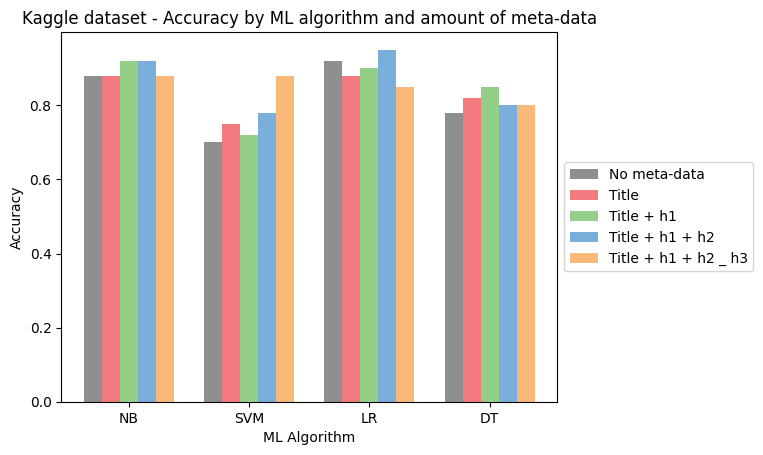

Results for 200 Kaggle articles...
Accuracy for text only
NB :  0.8
SVM :  0.76
LR :  0.82
DT :  0.82

Accuracy for text and title
NB :  0.85
SVM :  0.76
LR :  0.86
DT :  0.79

Accuracy for text, title and heading 1 data
NB :  0.84
SVM :  0.8
LR :  0.84
DT :  0.78

Accuracy for text, title and headings 1 and 2
NB :  0.88
SVM :  0.78
LR :  0.85
DT :  0.8

Accuracy for text, title and all heading data
NB :  0.85
SVM :  0.8
LR :  0.82
DT :  0.82


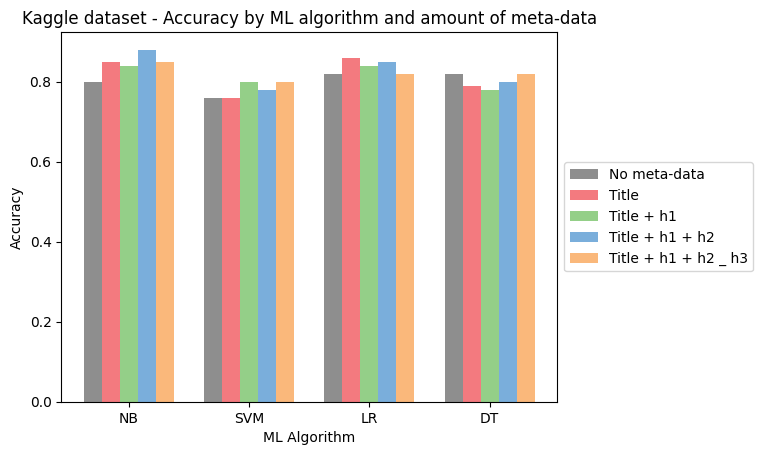

Results for 300 Kaggle articles...
Accuracy for text only
NB :  0.82
SVM :  0.79
LR :  0.86
DT :  0.76

Accuracy for text and title
NB :  0.79
SVM :  0.82
LR :  0.88
DT :  0.76

Accuracy for text, title and heading 1 data
NB :  0.8
SVM :  0.82
LR :  0.82
DT :  0.75

Accuracy for text, title and headings 1 and 2
NB :  0.8
SVM :  0.85
LR :  0.82
DT :  0.79

Accuracy for text, title and all heading data
NB :  0.61
SVM :  0.72
LR :  0.84
DT :  0.84


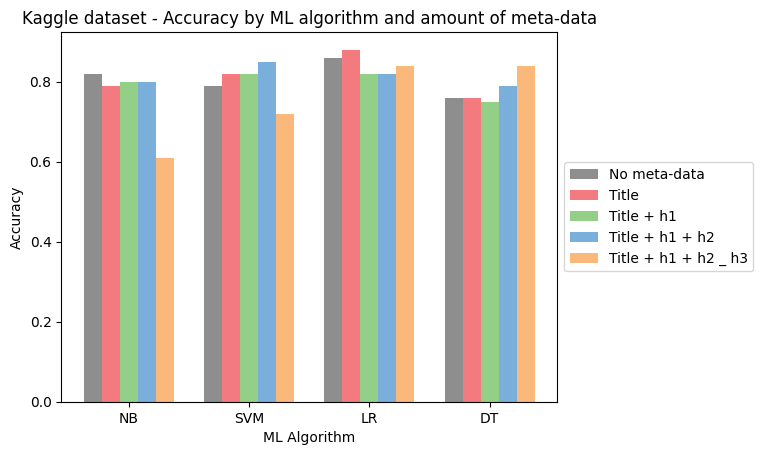

Results for 400 Kaggle articles...
Accuracy for text only
NB :  0.86
SVM :  0.89
LR :  0.91
DT :  0.84

Accuracy for text and title
NB :  0.88
SVM :  0.89
LR :  0.91
DT :  0.84

Accuracy for text, title and heading 1 data
NB :  0.88
SVM :  0.89
LR :  0.9
DT :  0.84

Accuracy for text, title and headings 1 and 2
NB :  0.89
SVM :  0.89
LR :  0.91
DT :  0.86

Accuracy for text, title and all heading data
NB :  0.88
SVM :  0.89
LR :  0.91
DT :  0.87


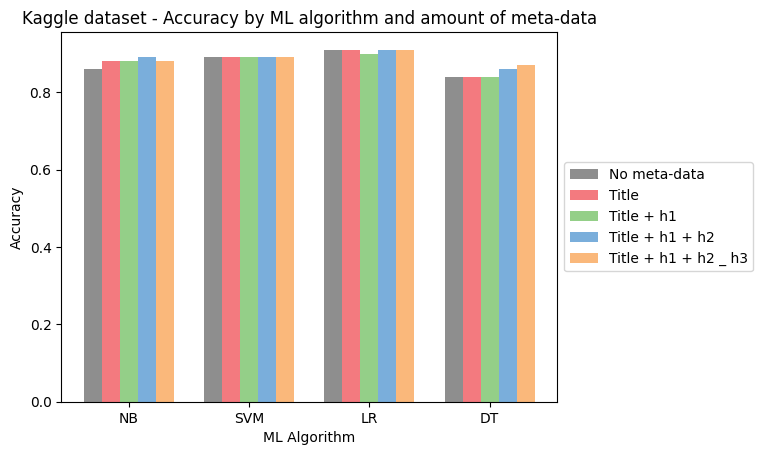

Results for 500 Kaggle articles...
Accuracy for text only
NB :  0.85
SVM :  0.82
LR :  0.86
DT :  0.78

Accuracy for text and title
NB :  0.85
SVM :  0.85
LR :  0.84
DT :  0.85

Accuracy for text, title and heading 1 data
NB :  0.85
SVM :  0.85
LR :  0.86
DT :  0.81

Accuracy for text, title and headings 1 and 2
NB :  0.86
SVM :  0.86
LR :  0.86
DT :  0.84

Accuracy for text, title and all heading data
NB :  0.76
SVM :  0.75
LR :  0.86
DT :  0.87


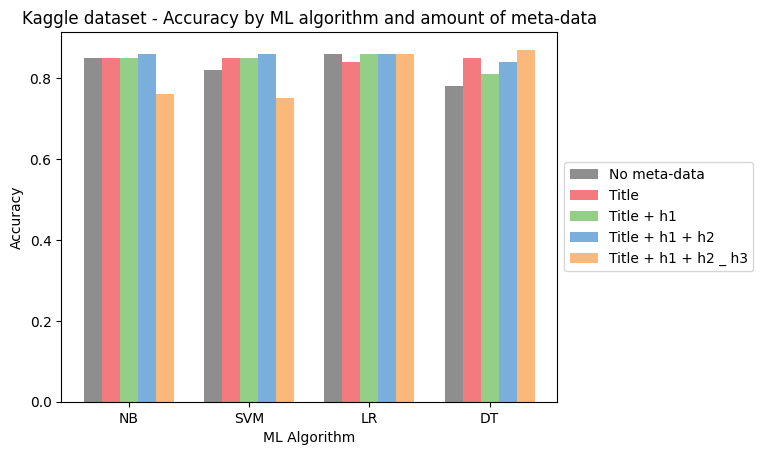

Results for 600 Kaggle articles...
Accuracy for text only
NB :  0.85
SVM :  0.84
LR :  0.86
DT :  0.76

Accuracy for text and title
NB :  0.81
SVM :  0.86
LR :  0.87
DT :  0.81

Accuracy for text, title and heading 1 data
NB :  0.81
SVM :  0.87
LR :  0.87
DT :  0.83

Accuracy for text, title and headings 1 and 2
NB :  0.82
SVM :  0.84
LR :  0.85
DT :  0.85

Accuracy for text, title and all heading data
NB :  0.76
SVM :  0.73
LR :  0.82
DT :  0.83


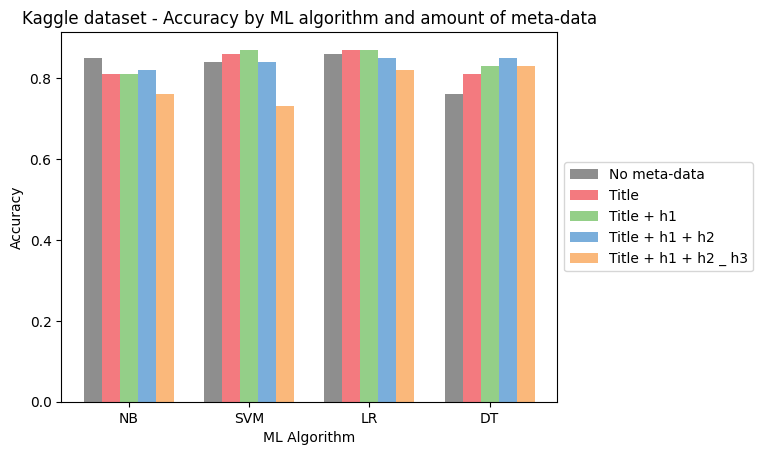

Results for 700 Kaggle articles...
Accuracy for text only
NB :  0.85
SVM :  0.82
LR :  0.88
DT :  0.76

Accuracy for text and title
NB :  0.86
SVM :  0.84
LR :  0.87
DT :  0.82

Accuracy for text, title and heading 1 data
NB :  0.85
SVM :  0.84
LR :  0.86
DT :  0.76

Accuracy for text, title and headings 1 and 2
NB :  0.85
SVM :  0.83
LR :  0.84
DT :  0.81

Accuracy for text, title and all heading data
NB :  0.82
SVM :  0.85
LR :  0.88
DT :  0.82


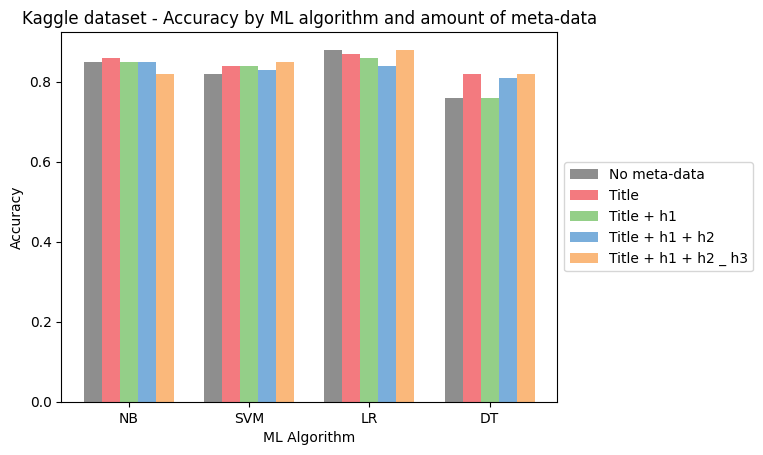

Results for 800 Kaggle articles...
Accuracy for text only
NB :  0.87
SVM :  0.8
LR :  0.88
DT :  0.8

Accuracy for text and title
NB :  0.86
SVM :  0.82
LR :  0.9
DT :  0.87

Accuracy for text, title and heading 1 data
NB :  0.84
SVM :  0.83
LR :  0.87
DT :  0.82

Accuracy for text, title and headings 1 and 2
NB :  0.84
SVM :  0.82
LR :  0.87
DT :  0.87

Accuracy for text, title and all heading data
NB :  0.81
SVM :  0.75
LR :  0.85
DT :  0.85


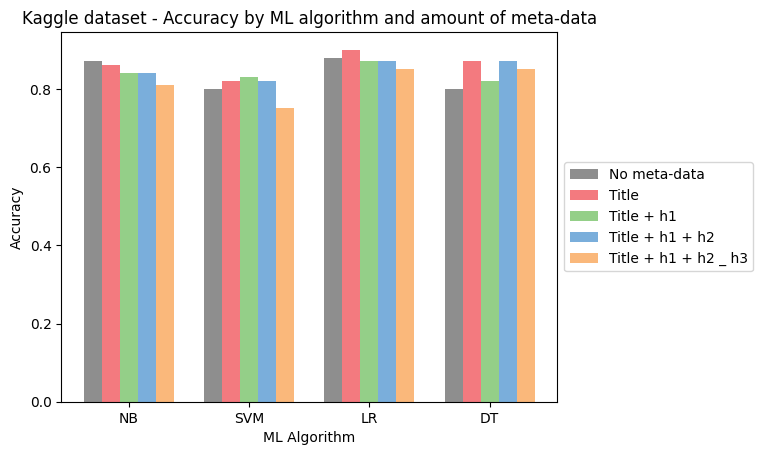

Results for 900 Kaggle articles...
Accuracy for text only
NB :  0.88
SVM :  0.84
LR :  0.89
DT :  0.8

Accuracy for text and title
NB :  0.86
SVM :  0.84
LR :  0.89
DT :  0.83

Accuracy for text, title and heading 1 data
NB :  0.86
SVM :  0.85
LR :  0.88
DT :  0.83

Accuracy for text, title and headings 1 and 2
NB :  0.86
SVM :  0.86
LR :  0.88
DT :  0.84

Accuracy for text, title and all heading data
NB :  0.85
SVM :  0.84
LR :  0.87
DT :  0.82


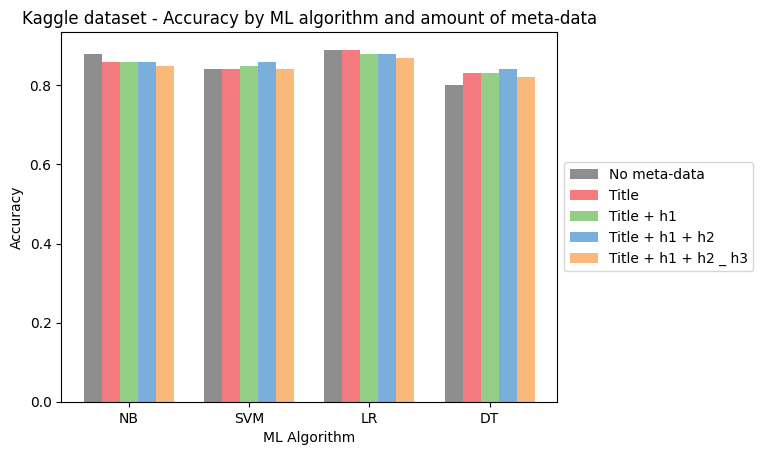

Results for 1000 Kaggle articles...
Accuracy for text only
NB :  0.86
SVM :  0.84
LR :  0.9
DT :  0.81

Accuracy for text and title
NB :  0.86
SVM :  0.85
LR :  0.88
DT :  0.84

Accuracy for text, title and heading 1 data
NB :  0.86
SVM :  0.86
LR :  0.87
DT :  0.84

Accuracy for text, title and headings 1 and 2
NB :  0.83
SVM :  0.76
LR :  0.86
DT :  0.86

Accuracy for text, title and all heading data
NB :  0.82
SVM :  0.76
LR :  0.88
DT :  0.8


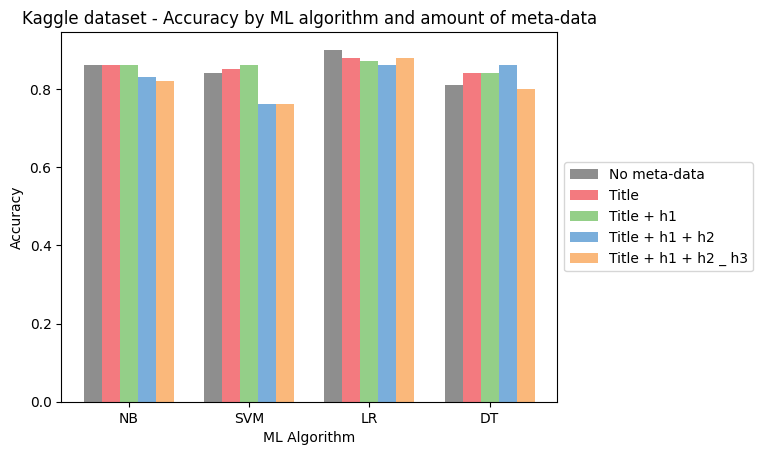

In [95]:
# This will loop through the 'num_news_articles' list
# and run the ML models on the dataset.
# The purpose of this is to see if different size datasets 
# perform better than others
for num_news_article in num_news_articles:
    ShowAllKaggleResults(num_news_article)

Results for 100 Liar articles...
Accuracy for text only
NB :  0.42
SVM :  0.52
LR :  0.48
DT :  0.38

Accuracy for text and title
NB :  0.45
SVM :  0.48
LR :  0.32
DT :  0.42

Accuracy for text, title and heading 1 data
NB :  0.5
SVM :  0.5
LR :  0.45
DT :  0.4

Accuracy for text, title and headings 1 and 2
NB :  0.55
SVM :  0.52
LR :  0.45
DT :  0.57

Accuracy for text, title and all heading data
NB :  0.48
SVM :  0.52
LR :  0.5
DT :  0.48


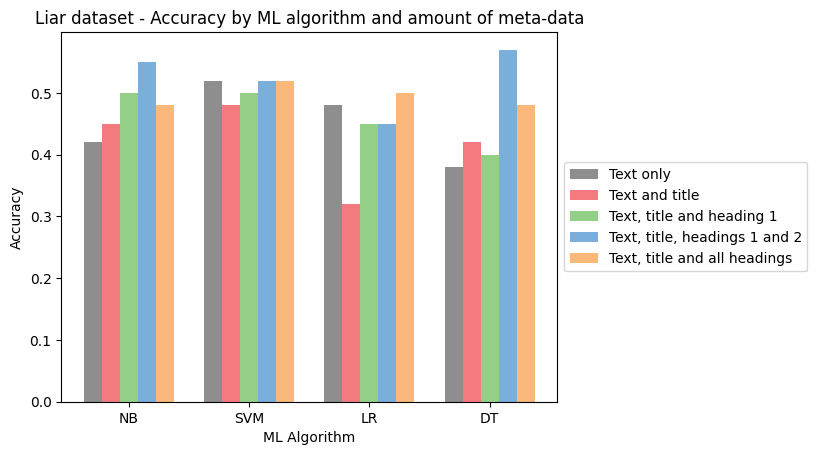

Results for 200 Liar articles...
Accuracy for text only
NB :  0.56
SVM :  0.57
LR :  0.56
DT :  0.5

Accuracy for text and title
NB :  0.6
SVM :  0.5
LR :  0.61
DT :  0.52

Accuracy for text, title and heading 1 data
NB :  0.55
SVM :  0.51
LR :  0.57
DT :  0.59

Accuracy for text, title and headings 1 and 2
NB :  0.55
SVM :  0.59
LR :  0.49
DT :  0.57

Accuracy for text, title and all heading data
NB :  0.51
SVM :  0.56
LR :  0.49
DT :  0.55


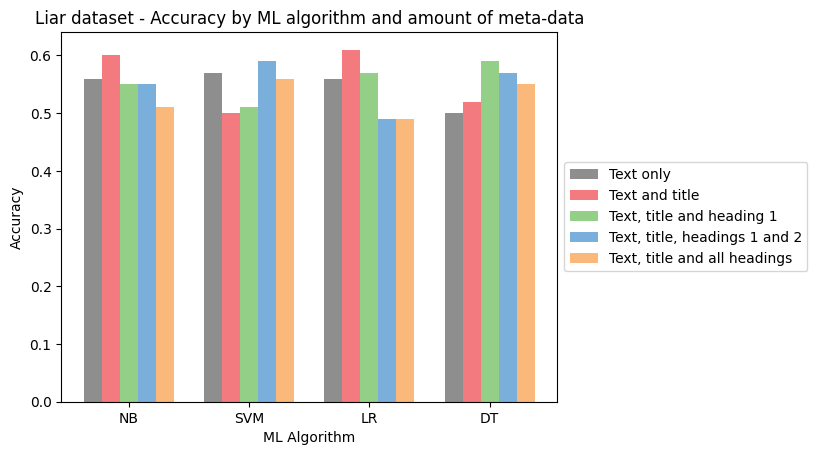

Results for 300 Liar articles...
Accuracy for text only
NB :  0.58
SVM :  0.54
LR :  0.54
DT :  0.53

Accuracy for text and title
NB :  0.59
SVM :  0.61
LR :  0.57
DT :  0.56

Accuracy for text, title and heading 1 data
NB :  0.6
SVM :  0.6
LR :  0.5
DT :  0.52

Accuracy for text, title and headings 1 and 2
NB :  0.58
SVM :  0.51
LR :  0.55
DT :  0.56

Accuracy for text, title and all heading data
NB :  0.58
SVM :  0.51
LR :  0.52
DT :  0.59


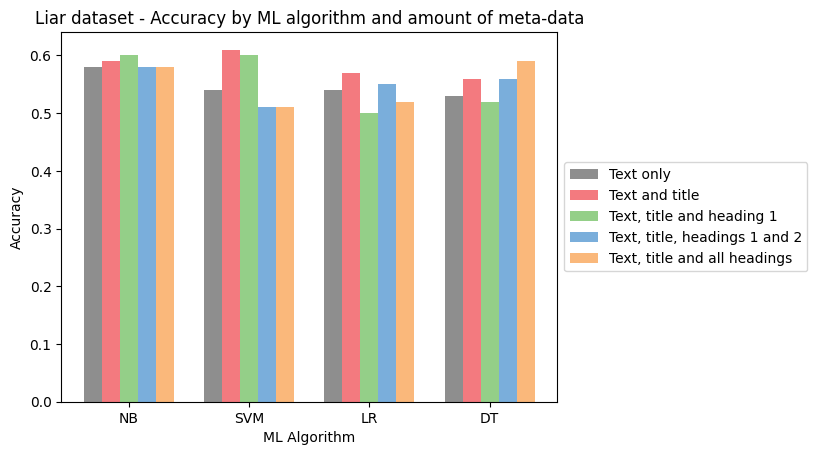

Results for 400 Liar articles...
Accuracy for text only
NB :  0.54
SVM :  0.6
LR :  0.51
DT :  0.57

Accuracy for text and title
NB :  0.6
SVM :  0.57
LR :  0.58
DT :  0.49

Accuracy for text, title and heading 1 data
NB :  0.61
SVM :  0.62
LR :  0.57
DT :  0.6

Accuracy for text, title and headings 1 and 2
NB :  0.54
SVM :  0.45
LR :  0.45
DT :  0.59

Accuracy for text, title and all heading data
NB :  0.56
SVM :  0.46
LR :  0.51
DT :  0.53


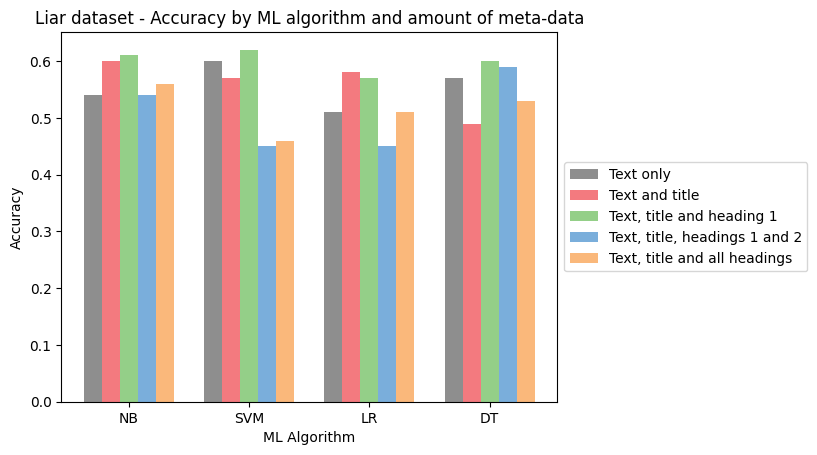

Results for 500 Liar articles...
Accuracy for text only
NB :  0.56
SVM :  0.55
LR :  0.55
DT :  0.56

Accuracy for text and title
NB :  0.58
SVM :  0.59
LR :  0.5
DT :  0.56

Accuracy for text, title and heading 1 data
NB :  0.56
SVM :  0.58
LR :  0.55
DT :  0.48

Accuracy for text, title and headings 1 and 2
NB :  0.52
SVM :  0.53
LR :  0.52
DT :  0.54

Accuracy for text, title and all heading data
NB :  0.52
SVM :  0.56
LR :  0.56
DT :  0.59


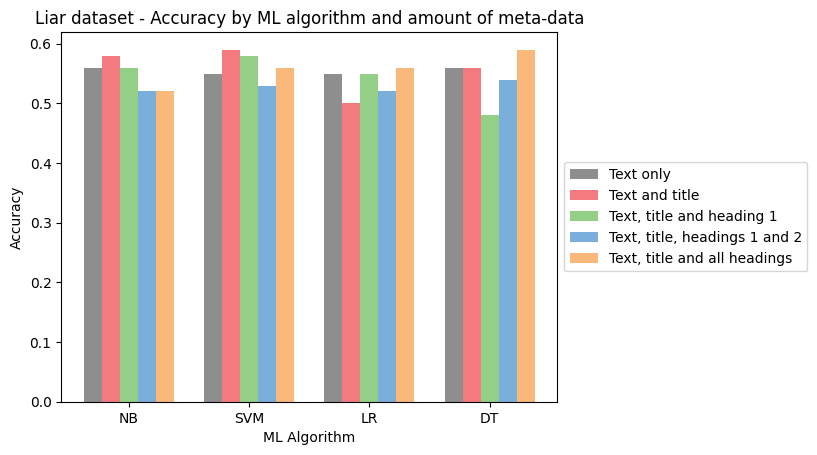

Results for 600 Liar articles...
Accuracy for text only
NB :  0.55
SVM :  0.6
LR :  0.51
DT :  0.5

Accuracy for text and title
NB :  0.53
SVM :  0.56
LR :  0.51
DT :  0.51

Accuracy for text, title and heading 1 data
NB :  0.55
SVM :  0.57
LR :  0.55
DT :  0.47

Accuracy for text, title and headings 1 and 2
NB :  0.55
SVM :  0.5
LR :  0.5
DT :  0.56

Accuracy for text, title and all heading data
NB :  0.53
SVM :  0.55
LR :  0.5
DT :  0.53


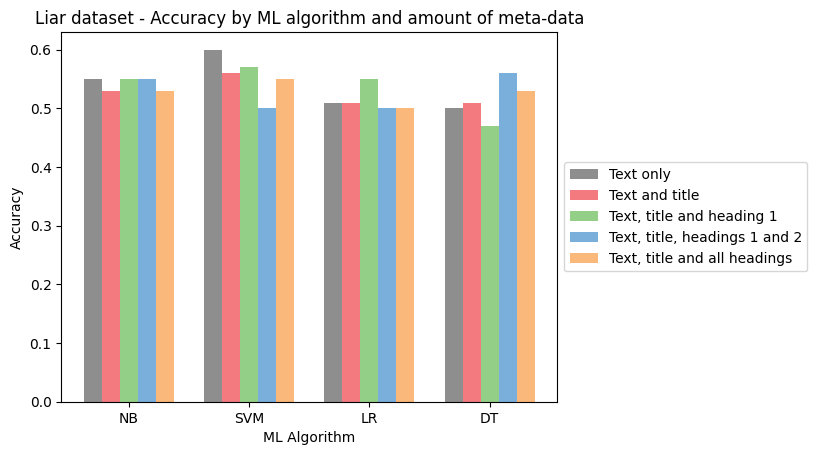

Results for 700 Liar articles...
Accuracy for text only
NB :  0.58
SVM :  0.57
LR :  0.51
DT :  0.51

Accuracy for text and title
NB :  0.54
SVM :  0.55
LR :  0.52
DT :  0.52

Accuracy for text, title and heading 1 data
NB :  0.53
SVM :  0.52
LR :  0.54
DT :  0.53

Accuracy for text, title and headings 1 and 2
NB :  0.47
SVM :  0.5
LR :  0.54
DT :  0.55

Accuracy for text, title and all heading data
NB :  0.46
SVM :  0.52
LR :  0.52
DT :  0.52


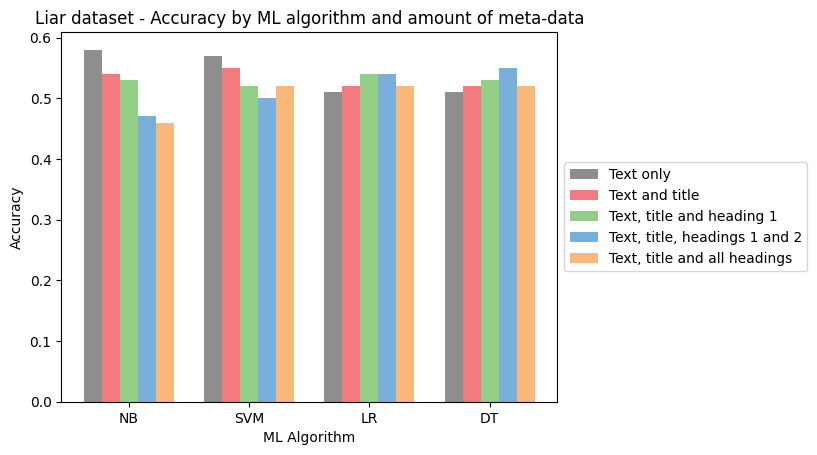

Results for 800 Liar articles...
Accuracy for text only
NB :  0.6
SVM :  0.63
LR :  0.51
DT :  0.57

Accuracy for text and title
NB :  0.54
SVM :  0.57
LR :  0.53
DT :  0.5

Accuracy for text, title and heading 1 data
NB :  0.55
SVM :  0.56
LR :  0.55
DT :  0.52

Accuracy for text, title and headings 1 and 2
NB :  0.51
SVM :  0.54
LR :  0.58
DT :  0.48

Accuracy for text, title and all heading data
NB :  0.55
SVM :  0.57
LR :  0.55
DT :  0.6


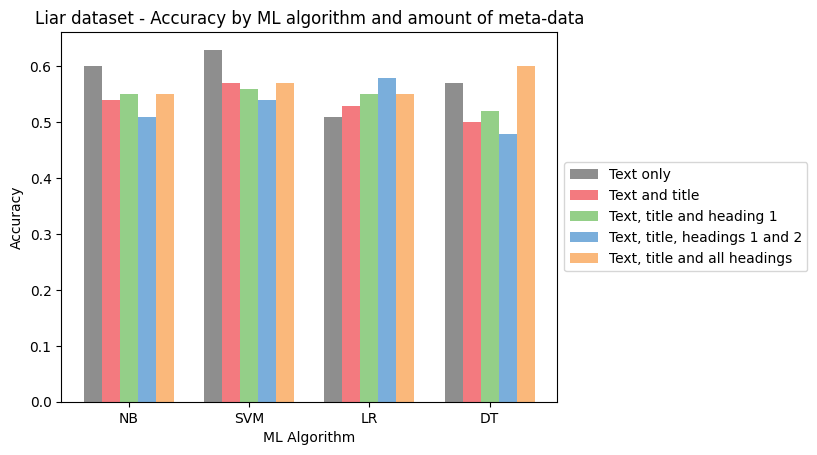

Results for 900 Liar articles...
Accuracy for text only
NB :  0.57
SVM :  0.57
LR :  0.58
DT :  0.5

Accuracy for text and title
NB :  0.55
SVM :  0.55
LR :  0.54
DT :  0.52

Accuracy for text, title and heading 1 data
NB :  0.55
SVM :  0.53
LR :  0.53
DT :  0.52

Accuracy for text, title and headings 1 and 2
NB :  0.51
SVM :  0.49
LR :  0.51
DT :  0.48

Accuracy for text, title and all heading data
NB :  0.51
SVM :  0.5
LR :  0.49
DT :  0.47


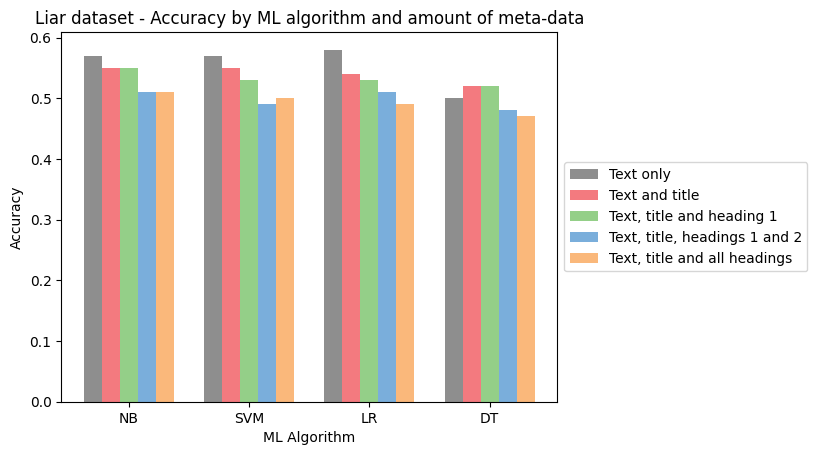

Results for 1000 Liar articles...
Accuracy for text only
NB :  0.52
SVM :  0.59
LR :  0.47
DT :  0.52

Accuracy for text and title
NB :  0.56
SVM :  0.56
LR :  0.49
DT :  0.51

Accuracy for text, title and heading 1 data
NB :  0.55
SVM :  0.56
LR :  0.48
DT :  0.52

Accuracy for text, title and headings 1 and 2
NB :  0.53
SVM :  0.54
LR :  0.54
DT :  0.54

Accuracy for text, title and all heading data
NB :  0.52
SVM :  0.51
LR :  0.55
DT :  0.52


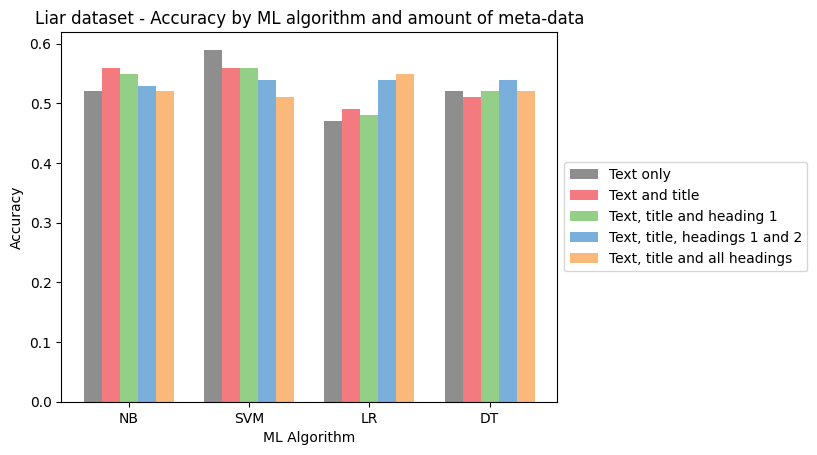

In [96]:
# Output from Liar dataset
for num_news_article in num_news_articles:
    ShowAllLiarResults(num_news_article)

<h3><center>Accuracy of ML models with/without meta-data</center></h3>
<h5><center>Kaggle dataset with 200 fake and 200 real news articles</center></h5>

| ML Model                  | No meta-data    | Title | Title + h1 | Title + h1 + h2 | Title + h1 + h2 _ h3 |
|:--------------------------|:---------------:|:-----:|:----------:|:---------------:|:--------------------:|
| Naive Bayes               |     0.80        | 0.85  |      0.84  |       0.88      |           0.85       |
| Support Vector Machine    |     0.76        | 0.76  |      0.80  |       0.78      |           0.80       |
| Logistic Rgression        |     0.82        | 0.86  |      0.84  |       0.85      |           0.82       |
| Decisionm Tree            |     0.82        | 0.79  |      0.78  |       0.80      |           0.82       |

<h5><center>Kaggle dataset with 900 fake and 900 real news articles</center></h5>

| ML Model               | Text only    | Text, Title | Text, Title, H1 | Text, Title, H1, H2 | Text, Title, H1, H2, H3 |
|:-----------------------|:------------:|:-----------:|:---------------:|:-------------------:|:-----------------------:|
| Naive Bayes            |     0.88     |      0.86   |           0.86  |           0.86      |           0.85          |
| Support Vector Machine |     0.84     |      0.84   |           0.85  |           0.86      |           0.84          |
| Logistic Regression    |     0.89     |      0.89   |           0.88  |           0.88      |           0.87          |
| Decision Tree          |     0.80     |      0.83   |           0.83  |           0.84      |           0.82          |

Results for 200 Kaggle articles...
Accuracy for text only
NB :  0.8
SVM :  0.76
LR :  0.82
DT :  0.82

Accuracy for text and title
NB :  0.85
SVM :  0.76
LR :  0.86
DT :  0.79

Accuracy for text, title and heading 1 data
NB :  0.84
SVM :  0.8
LR :  0.84
DT :  0.78

Accuracy for text, title and headings 1 and 2
NB :  0.88
SVM :  0.78
LR :  0.85
DT :  0.8

Accuracy for text, title and all heading data
NB :  0.85
SVM :  0.8
LR :  0.82
DT :  0.82


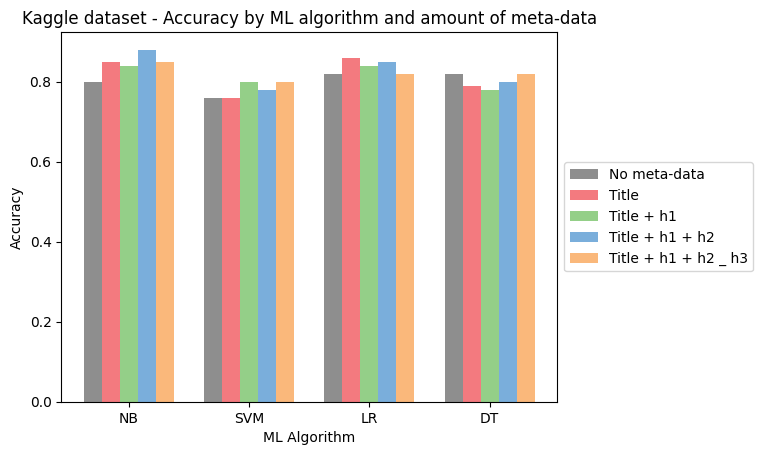

In [97]:
# Re-display this since it will be in the report
ShowAllKaggleResults(200)

Results for 900 Kaggle articles...
Accuracy for text only
NB :  0.88
SVM :  0.84
LR :  0.89
DT :  0.8

Accuracy for text and title
NB :  0.86
SVM :  0.84
LR :  0.89
DT :  0.83

Accuracy for text, title and heading 1 data
NB :  0.86
SVM :  0.85
LR :  0.88
DT :  0.83

Accuracy for text, title and headings 1 and 2
NB :  0.86
SVM :  0.86
LR :  0.88
DT :  0.84

Accuracy for text, title and all heading data
NB :  0.85
SVM :  0.84
LR :  0.87
DT :  0.82


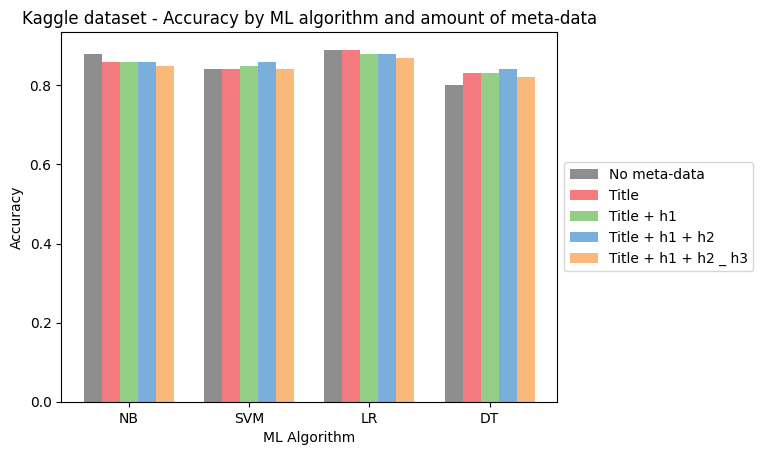

In [98]:
# Re-display this since it will be in the report
ShowAllKaggleResults(900)

<a id='9.nn-with-meta-data'></a>
# 9. Neural Network with meta-data

In [99]:
# Get the datasets for both Kaggle and Liar
df_kaggle, df_liar = CreateDatasetsWithMetaData(1000)

In [100]:
# This function gets the total number of words in a 
# This is used for the embedding layer of the Neural Network
def GetTotalWords(series_text):
    list_of_words = []
    for i in series_text:
        list_of_words.append(i)

    str1 = " "
    all_words = str1.join(list_of_words)
    return len(list(set(all_words.split())))

In [101]:
# This function creates the Sequential model
def CreateModel(total_words):
    # Sequential Model
    model = Sequential()

    # embeddidng layer
    model.add(Embedding(total_words, output_dim = 64))

    # Bi-Directional RNN and LSTM
    model.add(Bidirectional(LSTM(128)))

    # Dense layers
    model.add(Dense(128, activation = 'relu'))
    model.add(Dense(1,activation= 'sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [102]:
# This function gets the accuracy score
def GetModelAccuracy(st, yt):
# make prediction
    pred = model.predict(st)

    # if the predicted value is > 0.5 it is fake else it is real
    prediction = []
    for i in range(len(pred)):
        if pred[i].item() > 0.5:
            prediction.append(1)
        else:
            prediction.append(0)
            
    return accuracy_score(list(yt), prediction)

In [103]:
# This function creates and trains the model
def CreateAndTrainModel(text, label, list_to_append):
    # split data into test and train 
    x_train, x_test, y_train, y_test = train_test_split(text, label, test_size = 0.2)
    y_train = np.asarray(y_train)

    # Get the total numbner of words
    # This is used for the embedding layer
    total_words = GetTotalWords(text)

    # Create a tokenizer to tokenize the words and create sequences of tokenized words
    tokenizer = Tokenizer(num_words = total_words)
    tokenizer.fit_on_texts(x_train)
    train_sequences = tokenizer.texts_to_sequences(x_train)
    test_sequences = tokenizer.texts_to_sequences(x_test)

    # Add padding
    padded_train = pad_sequences(train_sequences,maxlen = 100, padding = 'post', truncating = 'post')
    padded_test = pad_sequences(test_sequences,maxlen = 100, truncating = 'post') 

    # Create the model
    CreateModel(total_words)

    # train the model
    model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)
    
    list_to_append.append(GetModelAccuracy(padded_test, y_test))

<a id='9.1-Kaggle-nn-meta-data'></a>
### 9.1 Kaggle with meta-data

In [104]:
# Number of times to run the Neural Network
# Will run teh model 10 times and take the average.
# This will be done for each additional piece of meta-data
num_iterations = 10

# Lists for each accuracy point
# These will be averaged
accuracy_kaggle_text_only = []
accuracy_kaggle_text_title = []
accuracy_kaggle_text_title_h1 = []
accuracy_kaggle_text_title_h1_h2 = []
accuracy_kaggle_text_title_h1_h2_h3 = []

# Create and Train the model on the Kaggle dataset
for x in range(num_iterations):
    CreateAndTrainModel(df_kaggle.clean_text_joined, df_kaggle.label, accuracy_kaggle_text_only)
    CreateAndTrainModel(df_kaggle.clean_text_title, df_kaggle.label, accuracy_kaggle_text_title)
    CreateAndTrainModel(df_kaggle.clean_text_title_h1, df_kaggle.label, accuracy_kaggle_text_title_h1)
    CreateAndTrainModel(df_kaggle.clean_text_title_h1_h2, df_kaggle.label, accuracy_kaggle_text_title_h1_h2)
    CreateAndTrainModel(df_kaggle.clean_text_title_h1_h2_h3, df_kaggle.label, accuracy_kaggle_text_title_h1_h2_h3)

Epoch 1/2
23/23 [==============================] - 7s 307ms/step - loss: 0.6975 - acc: 0.5063 - val_loss: 0.6932 - val_acc: 0.5125
Epoch 2/2
13/13 [==============================] - 1s 41ms/step
Epoch 1/2
23/23 [==============================] - 8s 354ms/step - loss: 0.6937 - acc: 0.4944 - val_loss: 0.6933 - val_acc: 0.4875
Epoch 2/2
13/13 [==============================] - 1s 40ms/step
Epoch 1/2
23/23 [==============================] - 8s 349ms/step - loss: 0.6934 - acc: 0.5146 - val_loss: 0.6915 - val_acc: 0.5750
Epoch 2/2
13/13 [==============================] - 1s 42ms/step
Epoch 1/2
23/23 [==============================] - 8s 364ms/step - loss: 0.6931 - acc: 0.4938 - val_loss: 0.6920 - val_acc: 0.5437
Epoch 2/2
13/13 [==============================] - 1s 40ms/step
Epoch 1/2
23/23 [==============================] - 8s 351ms/step - loss: 0.6920 - acc: 0.5382 - val_loss: 0.6775 - val_acc: 0.6313
Epoch 2/2
13/13 [==============================] - 1s 41ms/step
Epoch 1/2
23/23 [========

13/13 [==============================] - 1s 50ms/step
Epoch 1/2
23/23 [==============================] - 9s 390ms/step - loss: 0.6183 - acc: 0.7014 - val_loss: 0.4438 - val_acc: 0.7688
Epoch 2/2
13/13 [==============================] - 1s 43ms/step
Epoch 1/2
23/23 [==============================] - 8s 337ms/step - loss: 0.6385 - acc: 0.6861 - val_loss: 0.5733 - val_acc: 0.7188
Epoch 2/2
13/13 [==============================] - 1s 81ms/step
Epoch 1/2
23/23 [==============================] - 12s 535ms/step - loss: 0.7243 - acc: 0.6313 - val_loss: 0.5111 - val_acc: 0.7688
Epoch 2/2
13/13 [==============================] - 1s 80ms/step
Epoch 1/2
23/23 [==============================] - 11s 462ms/step - loss: 0.6516 - acc: 0.6674 - val_loss: 0.5300 - val_acc: 0.7375
Epoch 2/2
13/13 [==============================] - 1s 89ms/step
Epoch 1/2
23/23 [==============================] - 12s 520ms/step - loss: 0.6242 - acc: 0.6833 - val_loss: 0.5178 - val_acc: 0.7312
Epoch 2/2
13/13 [===============

<a id='9.2-Liar-nn-meta-data'></a>
### 9.2 Liar with meta-data

In [105]:
# Number of times to run the Neural Network
# Will run teh model 10 times and take the average.
# This will be done for each additional piece of meta-data
num_iterations = 10

# Lists for each accuracy point
# These will be averaged
accuracy_liar_text_only = []
accuracy_liar_text_title = []
accuracy_liar_text_title_h1 = []
accuracy_liar_text_title_h1_h2 = []
accuracy_liar_text_title_h1_h2_h3 = []

# Create and Train the model on the Liar dataset
for x in range(num_iterations):
    CreateAndTrainModel(df_liar.clean_text_joined, df_liar.label, accuracy_liar_text_only)
    CreateAndTrainModel(df_liar.clean_text_title, df_liar.label, accuracy_liar_text_title)
    CreateAndTrainModel(df_liar.clean_text_title_h1, df_liar.label, accuracy_liar_text_title_h1)
    CreateAndTrainModel(df_liar.clean_text_title_h1_h2, df_liar.label, accuracy_liar_text_title_h1_h2)
    CreateAndTrainModel(df_liar.clean_text_title_h1_h2_h3, df_liar.label, accuracy_liar_text_title_h1_h2_h3)

Epoch 1/2
23/23 [==============================] - 11s 468ms/step - loss: 0.9206 - acc: 0.5153 - val_loss: 0.7052 - val_acc: 0.4688
Epoch 2/2
13/13 [==============================] - 1s 83ms/step
Epoch 1/2
23/23 [==============================] - 11s 482ms/step - loss: 0.7191 - acc: 0.5021 - val_loss: 0.6855 - val_acc: 0.5437
Epoch 2/2
13/13 [==============================] - 1s 72ms/step
Epoch 1/2
23/23 [==============================] - 11s 468ms/step - loss: 0.7001 - acc: 0.4993 - val_loss: 0.7025 - val_acc: 0.4688
Epoch 2/2
13/13 [==============================] - 1s 75ms/step
Epoch 1/2
23/23 [==============================] - 13s 560ms/step - loss: 0.7033 - acc: 0.4993 - val_loss: 0.7109 - val_acc: 0.4875
Epoch 2/2
13/13 [==============================] - 1s 68ms/step
Epoch 1/2
23/23 [==============================] - 13s 563ms/step - loss: 0.7008 - acc: 0.4979 - val_loss: 0.6839 - val_acc: 0.4750
Epoch 2/2
13/13 [==============================] - 1s 97ms/step
Epoch 1/2
23/23 [===

13/13 [==============================] - 1s 78ms/step
Epoch 1/2
23/23 [==============================] - 11s 493ms/step - loss: 0.7100 - acc: 0.5354 - val_loss: 0.6698 - val_acc: 0.6187
Epoch 2/2
13/13 [==============================] - 1s 81ms/step
Epoch 1/2
23/23 [==============================] - 12s 504ms/step - loss: 0.7172 - acc: 0.5271 - val_loss: 0.6874 - val_acc: 0.5437
Epoch 2/2
13/13 [==============================] - 1s 88ms/step
Epoch 1/2
23/23 [==============================] - 11s 489ms/step - loss: 0.6964 - acc: 0.5528 - val_loss: 0.7029 - val_acc: 0.5375
Epoch 2/2
13/13 [==============================] - 1s 73ms/step
Epoch 1/2
23/23 [==============================] - 12s 538ms/step - loss: 0.7343 - acc: 0.5319 - val_loss: 0.7175 - val_acc: 0.5188
Epoch 2/2
13/13 [==============================] - 1s 86ms/step
Epoch 1/2
23/23 [==============================] - 12s 538ms/step - loss: 0.7202 - acc: 0.5167 - val_loss: 0.7130 - val_acc: 0.5000
Epoch 2/2
13/13 [=============

<a id='9.3-nn-assessment'></a>
### 9.3 Assessment of Neural Network with meta-data

In [106]:
# Create lists of the average accuracies to display on the charts
kaggle_meta = [round(mean(accuracy_kaggle_text_only),2), round(mean(accuracy_kaggle_text_title),2), round(mean(accuracy_kaggle_text_title_h1),2), round(mean(accuracy_kaggle_text_title_h1_h2),2), round(mean(accuracy_kaggle_text_title_h1_h2_h3),2)]
liar_meta = [round(mean(accuracy_liar_text_only),2), round(mean(accuracy_liar_text_title),2), round(mean(accuracy_liar_text_title_h1),2), round(mean(accuracy_liar_text_title_h1_h2),2), round(mean(accuracy_liar_text_title_h1_h2_h3),2)]

In [107]:
# Show the Kaggle list of accuracies
kaggle_meta

[0.77, 0.76, 0.78, 0.77, 0.81]

In [108]:
# Show the Liar list of accuracies
liar_meta

[0.49, 0.53, 0.51, 0.53, 0.53]

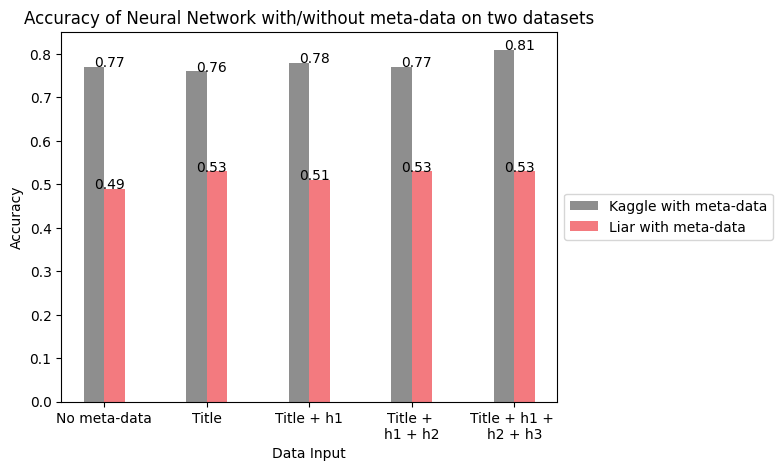

In [109]:
# Plot the accuracy of both the Kaggle and Liar datasets with/without meta-data
n_groups = 5

meta_data = ['No meta-data', 'Title', 'Title + h1', 'Title + \nh1 + h2', 'Title + h1 + \nh2 + h3']
            
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.2
opacity = 0.8

rects1 = plt.bar(index, kaggle_meta, bar_width, alpha=opacity, color='#727272', label='Kaggle with meta-data')
rects2 = plt.bar(index + bar_width, liar_meta, bar_width,alpha=opacity,color='#f1595f', label='Liar with meta-data')

plt.xlabel("Data Input")
plt.ylabel("Accuracy")
plt.title("Accuracy of Neural Network with/without meta-data on two datasets")
plt.xticks(index + bar_width/2, meta_data)

for i in range(len(kaggle_meta)):
    plt.text(i,kaggle_meta[i],kaggle_meta[i])
    plt.text(i,liar_meta[i],liar_meta[i])
    
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# plt.tight_layout()
plt.show()

Results for 1000 Kaggle articles...
Accuracy for text only
NB :  0.86
SVM :  0.84
LR :  0.9
DT :  0.81

Accuracy for text and title
NB :  0.86
SVM :  0.85
LR :  0.88
DT :  0.84

Accuracy for text, title and heading 1 data
NB :  0.86
SVM :  0.86
LR :  0.87
DT :  0.84

Accuracy for text, title and headings 1 and 2
NB :  0.83
SVM :  0.76
LR :  0.86
DT :  0.86

Accuracy for text, title and all heading data
NB :  0.82
SVM :  0.76
LR :  0.88
DT :  0.8


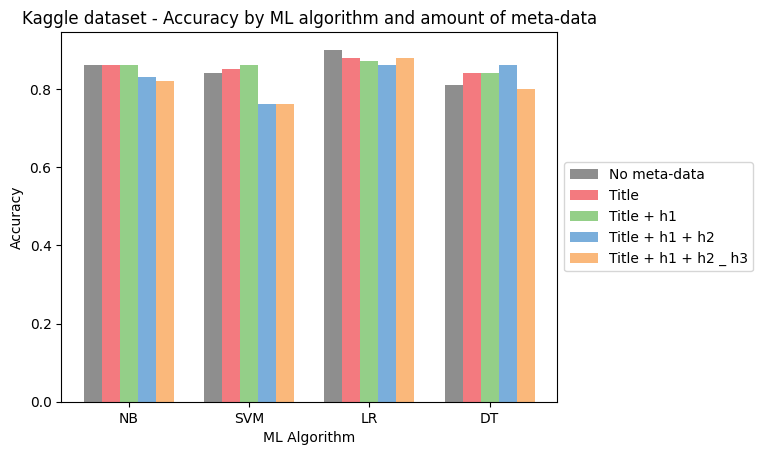

In [110]:
# Show the Kaggle results on a dataset of 1000 articles
ShowAllKaggleResults(1000)

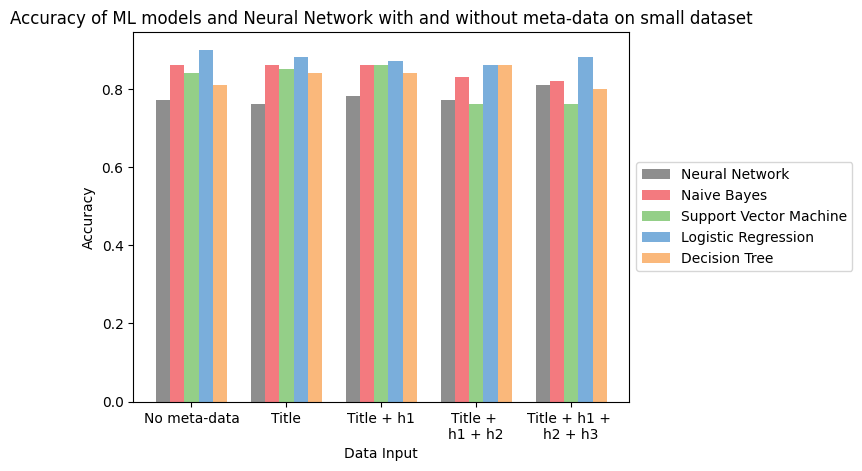

In [111]:
# Plot the accuracy of ML models and Neural Network with meta-data on small dataset (1000 fake and 1000 real articles)
n_groups = 5

meta_data = ['No meta-data', 'Title', 'Title + h1', 'Title + \nh1 + h2', 'Title + h1 + \nh2 + h3']
nb = [0.86, 0.86, 0.86, 0.83, 0.82]
svm = [0.84, 0.85, 0.86, 0.76, 0.76]
lr = [0.9, 0.88, 0.87, 0.86, 0.88]
dt = [0.81, 0.84, 0.84, 0.86, 0.8]

            
# create plot
fig, ax = plt.subplots()
index = np.arange(n_groups)
bar_width = 0.15
opacity = 0.8

rects1 = plt.bar(index, kaggle_meta, bar_width, alpha=opacity, color='#727272', label='Neural Network')
rects2 = plt.bar(index + bar_width, nb, bar_width,alpha=opacity,color='#f1595f', label='Naive Bayes')
rects3 = plt.bar(index + bar_width * 2, svm, bar_width,alpha=opacity,color='#79c36a',label='Support Vector Machine')
rects4 = plt.bar(index + bar_width * 3, lr, bar_width,alpha=opacity,color='#599ad3', label='Logistic Regression')
rects5 = plt.bar(index + bar_width * 4, dt, bar_width,alpha=opacity,color='#f9a65a', label='Decision Tree')

plt.xlabel("Data Input")
plt.ylabel("Accuracy")
plt.title("Accuracy of ML models and Neural Network with and without meta-data on small dataset")
plt.xticks(index + bar_width *2, meta_data)

    
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

# plt.tight_layout()
plt.show()

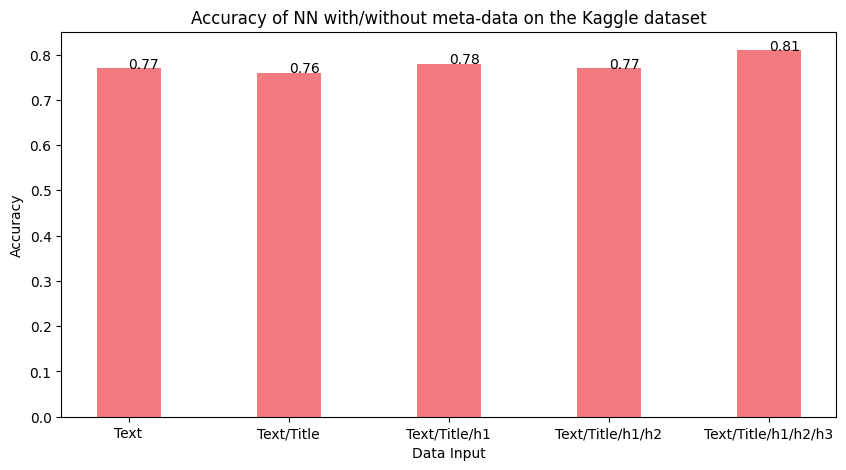

In [112]:
# Plot the accuracy of the Kaggle dataset with/without meta-data
data = {'Text':round(mean(accuracy_kaggle_text_only),2),
        'Text/Title':round(mean(accuracy_kaggle_text_title),2), 
        'Text/Title/h1':round(mean(accuracy_kaggle_text_title_h1),2),
        'Text/Title/h1/h2':round(mean(accuracy_kaggle_text_title_h1_h2),2),
        'Text/Title/h1/h2/h3':round(mean(accuracy_kaggle_text_title_h1_h2_h3),2)}
dataset = list(data.keys())
acc_scores = list(data.values())
  
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(dataset, acc_scores, alpha=0.8, color ='#f1595f', width = 0.4)


# for index, value in enumerate(acc_scores):
#     plt.text(value, index, str(value))
    
for i in range(len(acc_scores)):
    plt.text(i,acc_scores[i],acc_scores[i])    
    
plt.xlabel("Data Input")
plt.ylabel("Accuracy")
plt.title("Accuracy of NN with/without meta-data on the Kaggle dataset")
plt.show()

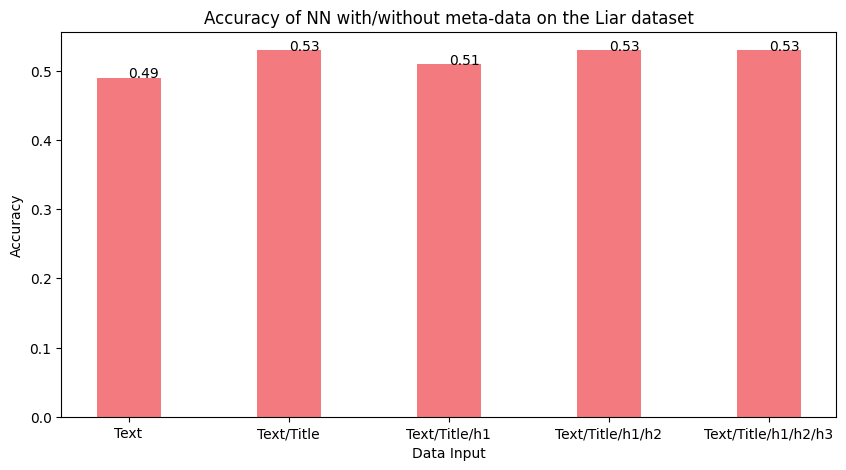

In [113]:
# Plot the accuracy of the Liar dataset with/without meta-data
data = {'Text':round(mean(accuracy_liar_text_only),2),
        'Text/Title':round(mean(accuracy_liar_text_title),2), 
        'Text/Title/h1':round(mean(accuracy_liar_text_title_h1),2),
        'Text/Title/h1/h2':round(mean(accuracy_liar_text_title_h1_h2),2),
        'Text/Title/h1/h2/h3':round(mean(accuracy_liar_text_title_h1_h2_h3),2)}
dataset = list(data.keys())
acc_scores = list(data.values())
  
fig = plt.figure(figsize = (10, 5))
# creating the bar plot
plt.bar(dataset, acc_scores, alpha=0.8, color ='#f1595f', width = 0.4)
    
for i in range(len(acc_scores)):
    plt.text(i,acc_scores[i],acc_scores[i])    
    
plt.xlabel("Data Input")
plt.ylabel("Accuracy")
plt.title("Accuracy of NN with/without meta-data on the Liar dataset")
plt.show()

In [114]:
end = time.time()

In [115]:
print("Running this code takes:", round((end-start)/60,1), "minutes.")

Running this code takes: 63.3 minutes.
